# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

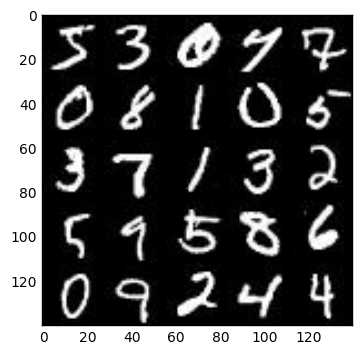

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

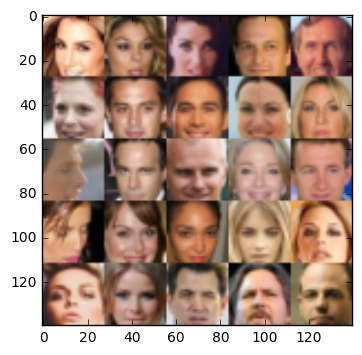

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1


C:\Program Files\Anaconda3\lib\site-packages\ipykernel\__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_ = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='real_input')
    z      = tf.placeholder(tf.float32,(None, z_dim), name='z')
    learning_rate = tf.placeholder(tf.float32)

    return input_, z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "C:\\Program Files\\Anaconda3\\lib\\runpy.py", line 184, in _run_module_as_main\n    "__main__", mod_spec)', 'File "C:\\Program Files\\Anaconda3\\lib\\runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "C:\\Program Files\\Anaconda3\\lib\\site-packages\\ipykernel\\__main__.py", line 3, in <module>\n    app.launch_new_instance()', 'File "C:\\Program Files\\Anaconda3\\lib\\site-packages\\traitlets\\config\\application.py", line 653, in launch_instance\n    app.start()', 'File "C:\\Program Files\\Anaconda3\\lib\\site-packages\\ipykernel\\kernelapp.py", line 474, in start\n    ioloop.IOLoop.instance().start()', 'File "C:\\Program Files\\Anaconda3\\lib\\site-packages\\zmq\\eventloop\\io

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [29]:
def discriminator(images, reuse=False, alpha = 0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        #28*28*3
        x1 = tf.layers.conv2d(images, 32, 5, strides=2,padding='same')
        x1 = tf.layers.batch_normalization(x1)
        x1 = tf.maximum(alpha*x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob=0.5)
        #14*14*32
        
        x2 = tf.layers.conv2d(x1, 64, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2)
        x2 = tf.maximum(alpha*x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob=0.5)
        #7*7*64
        
        x3 = tf.layers.conv2d(x2, 128, 5, strides=2, padding='valid')
        x3 = tf.layers.batch_normalization(x3)
        x3 = tf.maximum(alpha*x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob=0.5)

        
        flat = tf.reshape(x3, (-1,2*2*128))
        logits = tf.layers.dense(flat, 1)
        output = tf.nn.sigmoid(logits)
        
        

    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [39]:
import numpy as np
def generator(z, out_channel_dim, is_train= True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=(not is_train)):
        x1 = tf.layers.dense(z, 4*4*512)

        x1 = tf.reshape(x1, (-1,4,4,512))
        x1 = tf.layers.batch_normalization(x1, training= is_train)
        x1 = tf.maximum(alpha*x1, x1)
        #4*4*512

        x2 = tf.layers.conv2d_transpose(x1, filters=128, kernel_size=4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training= is_train)
        x2 = tf.maximum(alpha*x2, x2)
        #7*7*128
        
        x3 = tf.layers.conv2d_transpose(x2, filters=64, kernel_size=4, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training= is_train)
        x3 = tf.maximum(alpha*x3, x3)
        #14*14*64
        
        x4 = tf.layers.conv2d_transpose(x3, filters=32, kernel_size=4, strides=2, padding='same')
        x4 = tf.layers.batch_normalization(x4, training= is_train)
        x4 = tf.maximum(alpha*x4, x4)
        #28*28*32


        logits = tf.layers.conv2d_transpose(x4, filters=out_channel_dim, kernel_size=3, strides=1, padding='same')

        output = tf.nn.tanh(logits)
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [41]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_output_real, d_logits_real = discriminator(input_real)
    d_output_fake, d_logits_fake = discriminator(g_model,reuse=True)  

    
    d_loss_real = tf.reduce_mean(
                    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real)*(1-0.1)))
    d_loss_fake = tf.reduce_mean(
                    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    g_loss = tf.reduce_mean(
                    tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake, labels= tf.ones_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake

    
    
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1= beta1).minimize(d_loss,var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list = g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [35]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, width, height, channels = data_shape
    input_, z, lr = model_inputs(width, height, channels, z_dim)
    #lr = tf.constant(learning_rate)
    d_loss, g_loss = model_loss(input_, z, channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    steps = 0
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_image in get_batches(batch_size):
                # TODO: Train Model
                batch_image = batch_image*2
                steps += 1
                batch_z = np.random.uniform(-1,1, (batch_size, z_dim))
                _ = sess.run(d_train_opt, feed_dict={input_:batch_image, z:batch_z, lr:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={z:batch_z, lr:learning_rate})
                
                train_d_loss = d_loss.eval({input_:batch_image, z:batch_z})
                train_g_loss = g_loss.eval({z:batch_z})
                if steps %10 ==0:
                    print('epoch {} d_loss {} g_loss {}'.format(epoch_i+1, train_d_loss, train_g_loss))
                if steps % 100 ==0:
                    show_generator_output(sess, 25, z, channels, data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

epoch 1 d_loss 1.0273572206497192 g_loss 0.7942641973495483
epoch 1 d_loss 0.9938997030258179 g_loss 0.8959521651268005
epoch 1 d_loss 1.456263780593872 g_loss 0.5255693197250366
epoch 1 d_loss 1.374108076095581 g_loss 0.7469235062599182
epoch 1 d_loss 1.2857438325881958 g_loss 0.8995586633682251
epoch 1 d_loss 1.5111908912658691 g_loss 0.5933771133422852
epoch 1 d_loss 1.9555367231369019 g_loss 1.1482361555099487
epoch 1 d_loss 1.1590158939361572 g_loss 0.9304807782173157
epoch 1 d_loss 1.012381911277771 g_loss 1.076117753982544
epoch 1 d_loss 1.1029607057571411 g_loss 1.0545783042907715


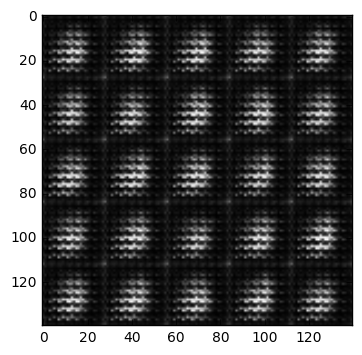

epoch 1 d_loss 1.1849653720855713 g_loss 0.7684512138366699
epoch 1 d_loss 1.093219518661499 g_loss 0.8468090891838074
epoch 1 d_loss 1.4371733665466309 g_loss 0.7425543069839478
epoch 1 d_loss 1.2652634382247925 g_loss 1.0026682615280151
epoch 1 d_loss 1.102552890777588 g_loss 1.3144001960754395
epoch 1 d_loss 1.135072946548462 g_loss 1.0263550281524658
epoch 1 d_loss 1.316312551498413 g_loss 0.8888570666313171
epoch 1 d_loss 1.3824268579483032 g_loss 0.8446685075759888
epoch 1 d_loss 1.6052567958831787 g_loss 0.7613546848297119
epoch 1 d_loss 1.5021483898162842 g_loss 0.7529351711273193


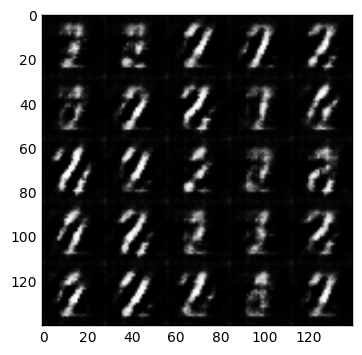

epoch 1 d_loss 1.4050570726394653 g_loss 0.7585396766662598
epoch 1 d_loss 1.318575143814087 g_loss 0.809971809387207
epoch 1 d_loss 1.3170220851898193 g_loss 0.7994285225868225
epoch 1 d_loss 1.3701198101043701 g_loss 0.8819923400878906
epoch 1 d_loss 1.3740792274475098 g_loss 0.8515090942382812
epoch 1 d_loss 1.297846794128418 g_loss 0.8763971328735352
epoch 1 d_loss 1.314103364944458 g_loss 0.8055934309959412
epoch 1 d_loss 1.4384446144104004 g_loss 0.7301342487335205
epoch 1 d_loss 1.4401097297668457 g_loss 0.7866883277893066
epoch 1 d_loss 1.1746948957443237 g_loss 0.9798160791397095


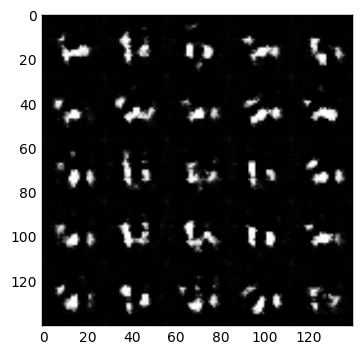

epoch 1 d_loss 1.6268426179885864 g_loss 0.7087991237640381
epoch 1 d_loss 1.3197999000549316 g_loss 0.9041589498519897
epoch 1 d_loss 1.4772076606750488 g_loss 0.8272889256477356
epoch 1 d_loss 1.349489688873291 g_loss 0.8187564015388489
epoch 1 d_loss 1.307732343673706 g_loss 0.8781810998916626
epoch 1 d_loss 1.4002745151519775 g_loss 0.7460969686508179
epoch 1 d_loss 1.383176326751709 g_loss 0.8305634260177612
epoch 1 d_loss 1.358208417892456 g_loss 0.7973516583442688
epoch 1 d_loss 1.4284902811050415 g_loss 0.7707915306091309
epoch 1 d_loss 1.366685152053833 g_loss 0.8417699337005615


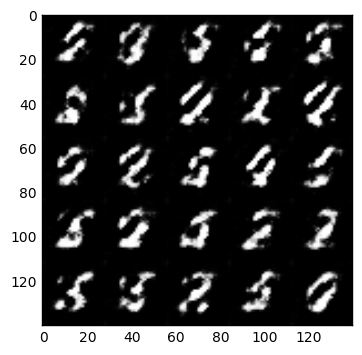

epoch 1 d_loss 1.3836171627044678 g_loss 0.8270097374916077
epoch 1 d_loss 1.3729603290557861 g_loss 0.7755371332168579
epoch 1 d_loss 1.3722082376480103 g_loss 0.7773882150650024
epoch 1 d_loss 1.3393326997756958 g_loss 0.8331311345100403
epoch 1 d_loss 1.3870840072631836 g_loss 0.801392138004303
epoch 1 d_loss 1.3498114347457886 g_loss 0.865314245223999
epoch 1 d_loss 1.3276035785675049 g_loss 0.8383222222328186
epoch 1 d_loss 1.3519313335418701 g_loss 0.8327159285545349
epoch 1 d_loss 1.381866455078125 g_loss 0.8468478322029114
epoch 1 d_loss 1.399129033088684 g_loss 0.8141202926635742


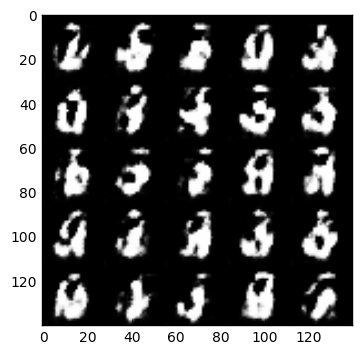

epoch 1 d_loss 1.340200424194336 g_loss 0.8674002885818481
epoch 1 d_loss 1.3525068759918213 g_loss 0.8754977583885193
epoch 1 d_loss 1.3813636302947998 g_loss 0.8100239038467407
epoch 1 d_loss 1.3624900579452515 g_loss 0.7524957656860352
epoch 1 d_loss 1.3615062236785889 g_loss 0.7966048717498779
epoch 1 d_loss 1.350608468055725 g_loss 0.8579721450805664
epoch 1 d_loss 1.3479610681533813 g_loss 0.818292498588562
epoch 1 d_loss 1.4389617443084717 g_loss 0.7819812297821045
epoch 1 d_loss 1.2966101169586182 g_loss 0.804316520690918
epoch 1 d_loss 1.421964168548584 g_loss 0.8301393985748291


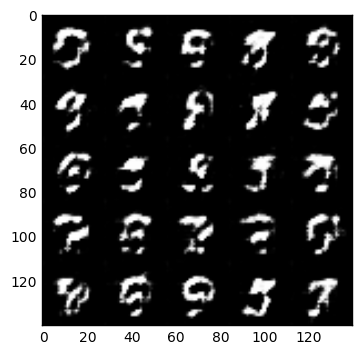

epoch 1 d_loss 1.3947794437408447 g_loss 0.8541776537895203
epoch 1 d_loss 1.2787187099456787 g_loss 0.8843084573745728
epoch 1 d_loss 1.3949191570281982 g_loss 0.813321590423584
epoch 1 d_loss 1.4342167377471924 g_loss 0.7967679500579834
epoch 1 d_loss 1.3536500930786133 g_loss 0.874577522277832
epoch 1 d_loss 1.3392584323883057 g_loss 0.748744010925293
epoch 1 d_loss 1.2222967147827148 g_loss 1.0282254219055176
epoch 1 d_loss 1.4559886455535889 g_loss 0.759707510471344
epoch 1 d_loss 1.3050780296325684 g_loss 0.8270504474639893
epoch 1 d_loss 1.3325384855270386 g_loss 0.8373491168022156


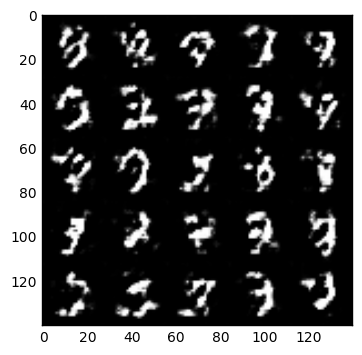

epoch 1 d_loss 1.377967119216919 g_loss 0.8328826427459717
epoch 1 d_loss 1.3668556213378906 g_loss 0.7940856218338013
epoch 1 d_loss 1.3521599769592285 g_loss 0.8195995092391968
epoch 1 d_loss 1.3639934062957764 g_loss 0.7869212627410889
epoch 1 d_loss 1.3148560523986816 g_loss 0.7368751764297485
epoch 1 d_loss 1.3139368295669556 g_loss 0.8050262928009033
epoch 1 d_loss 1.336876630783081 g_loss 0.7761201858520508
epoch 1 d_loss 1.4223347902297974 g_loss 0.8230952620506287
epoch 1 d_loss 1.3591549396514893 g_loss 0.8466489315032959
epoch 1 d_loss 1.331547737121582 g_loss 0.819897472858429


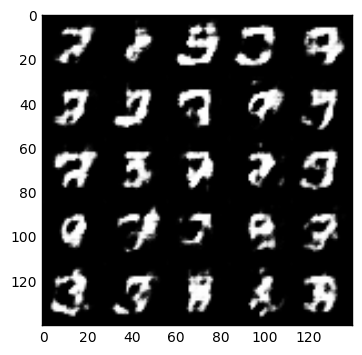

epoch 1 d_loss 1.3556180000305176 g_loss 0.7770038843154907
epoch 1 d_loss 1.4146040678024292 g_loss 0.7971683144569397
epoch 1 d_loss 1.3918704986572266 g_loss 0.7906683683395386
epoch 1 d_loss 1.339001178741455 g_loss 0.8465723991394043
epoch 1 d_loss 1.4163000583648682 g_loss 0.8406236171722412
epoch 1 d_loss 1.3230550289154053 g_loss 0.6974936723709106
epoch 1 d_loss 1.3478931188583374 g_loss 0.8352153897285461
epoch 1 d_loss 1.3919192552566528 g_loss 0.7721421122550964
epoch 1 d_loss 1.376979112625122 g_loss 0.7764942049980164
epoch 1 d_loss 1.3843634128570557 g_loss 0.8846124410629272


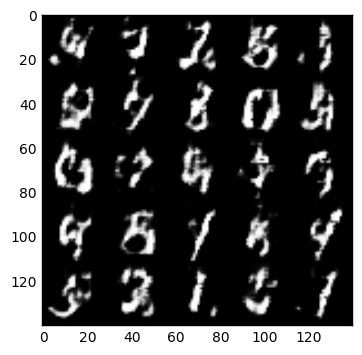

epoch 1 d_loss 1.3657714128494263 g_loss 0.8861172199249268
epoch 1 d_loss 1.298319935798645 g_loss 0.8206030130386353
epoch 1 d_loss 1.351905107498169 g_loss 0.7977972030639648
epoch 2 d_loss 1.3859922885894775 g_loss 0.8169112801551819
epoch 2 d_loss 1.3639285564422607 g_loss 0.8618263602256775
epoch 2 d_loss 1.3174937963485718 g_loss 0.7686153650283813
epoch 2 d_loss 1.38511061668396 g_loss 0.8133739829063416
epoch 2 d_loss 1.366966724395752 g_loss 0.8341614007949829
epoch 2 d_loss 1.3613767623901367 g_loss 0.8508063554763794
epoch 2 d_loss 1.3669230937957764 g_loss 0.8329782485961914


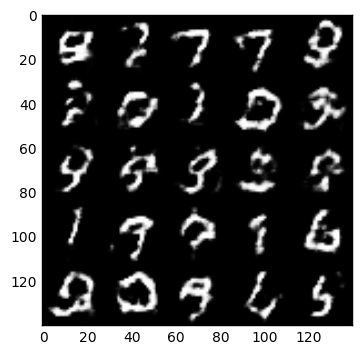

epoch 2 d_loss 1.340620994567871 g_loss 0.8096785545349121
epoch 2 d_loss 1.3858824968338013 g_loss 0.8093068599700928
epoch 2 d_loss 1.3837074041366577 g_loss 0.8024345636367798
epoch 2 d_loss 1.3691229820251465 g_loss 0.8055699467658997
epoch 2 d_loss 1.3484888076782227 g_loss 0.8175392150878906
epoch 2 d_loss 1.3897161483764648 g_loss 0.8358114361763
epoch 2 d_loss 1.3200308084487915 g_loss 0.7863577604293823
epoch 2 d_loss 1.3671982288360596 g_loss 0.849346399307251
epoch 2 d_loss 1.3811028003692627 g_loss 0.8340942859649658
epoch 2 d_loss 1.3655786514282227 g_loss 0.8345968723297119


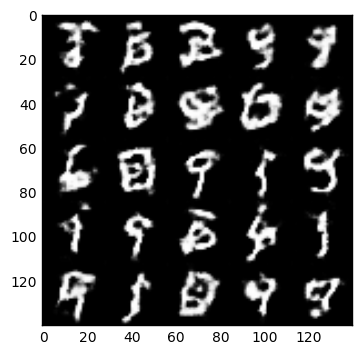

epoch 2 d_loss 1.3648685216903687 g_loss 0.8736046552658081
epoch 2 d_loss 1.3674123287200928 g_loss 0.8273990154266357
epoch 2 d_loss 1.3548301458358765 g_loss 0.7737879753112793
epoch 2 d_loss 1.3374261856079102 g_loss 0.7517191171646118
epoch 2 d_loss 1.3996925354003906 g_loss 0.7810696363449097
epoch 2 d_loss 1.3773298263549805 g_loss 0.8195379376411438
epoch 2 d_loss 1.378319263458252 g_loss 0.796811044216156
epoch 2 d_loss 1.4162722826004028 g_loss 0.806242048740387
epoch 2 d_loss 1.3738441467285156 g_loss 0.8294413089752197
epoch 2 d_loss 1.3943874835968018 g_loss 0.7990595102310181


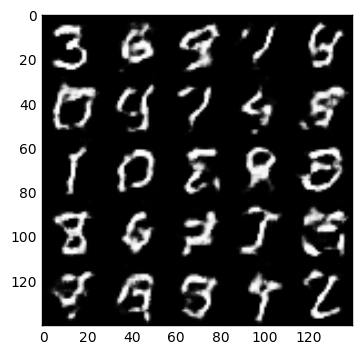

epoch 2 d_loss 1.358891248703003 g_loss 0.8533097505569458
epoch 2 d_loss 1.3674370050430298 g_loss 0.8117840886116028
epoch 2 d_loss 1.3729026317596436 g_loss 0.8519364595413208
epoch 2 d_loss 1.3556493520736694 g_loss 0.8117309808731079
epoch 2 d_loss 1.359403371810913 g_loss 0.7996035814285278
epoch 2 d_loss 1.3312420845031738 g_loss 0.7695339918136597
epoch 2 d_loss 1.3938655853271484 g_loss 0.8262319564819336
epoch 2 d_loss 1.357109785079956 g_loss 0.7551255822181702
epoch 2 d_loss 1.3743946552276611 g_loss 0.817852795124054
epoch 2 d_loss 1.3708877563476562 g_loss 0.8299742937088013


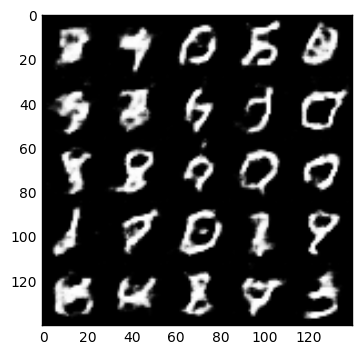

epoch 2 d_loss 1.3548767566680908 g_loss 0.8309354782104492
epoch 2 d_loss 1.4135205745697021 g_loss 0.8072690963745117
epoch 2 d_loss 1.3650233745574951 g_loss 0.7557119131088257
epoch 2 d_loss 1.3690998554229736 g_loss 0.8246452212333679
epoch 2 d_loss 1.4066472053527832 g_loss 0.8256030678749084
epoch 2 d_loss 1.3716092109680176 g_loss 0.8002172112464905
epoch 2 d_loss 1.3698856830596924 g_loss 0.8061444759368896
epoch 2 d_loss 1.3697998523712158 g_loss 0.8337416648864746
epoch 2 d_loss 1.3716479539871216 g_loss 0.7494361400604248
epoch 2 d_loss 1.387135624885559 g_loss 0.7937222719192505


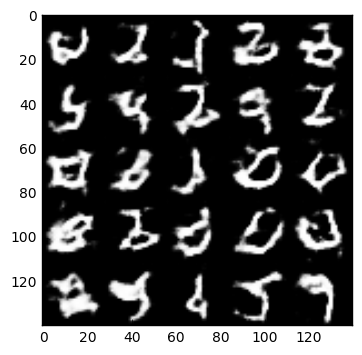

epoch 2 d_loss 1.4032665491104126 g_loss 0.8491148948669434
epoch 2 d_loss 1.3833379745483398 g_loss 0.8371130228042603
epoch 2 d_loss 1.3586311340332031 g_loss 0.7813605070114136
epoch 2 d_loss 1.37196683883667 g_loss 0.8012267351150513
epoch 2 d_loss 1.3758010864257812 g_loss 0.7987647652626038
epoch 2 d_loss 1.3570204973220825 g_loss 0.8491147756576538
epoch 2 d_loss 1.3863356113433838 g_loss 0.7723002433776855
epoch 2 d_loss 1.3812470436096191 g_loss 0.8335803747177124
epoch 2 d_loss 1.3755178451538086 g_loss 0.7660079002380371
epoch 2 d_loss 1.370193362236023 g_loss 0.7535152435302734


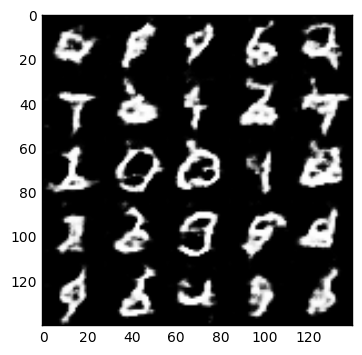

epoch 2 d_loss 1.3929004669189453 g_loss 0.7702610492706299
epoch 2 d_loss 1.3600564002990723 g_loss 0.7975103855133057
epoch 2 d_loss 1.3741965293884277 g_loss 0.7879865765571594
epoch 2 d_loss 1.3536155223846436 g_loss 0.7606427669525146
epoch 2 d_loss 1.3539118766784668 g_loss 0.7653803825378418
epoch 2 d_loss 1.3459081649780273 g_loss 0.8641080260276794
epoch 2 d_loss 1.3876397609710693 g_loss 0.8010329008102417
epoch 2 d_loss 1.3656384944915771 g_loss 0.7993500232696533
epoch 2 d_loss 1.385340929031372 g_loss 0.8415043354034424
epoch 2 d_loss 1.3923732042312622 g_loss 0.7510440349578857


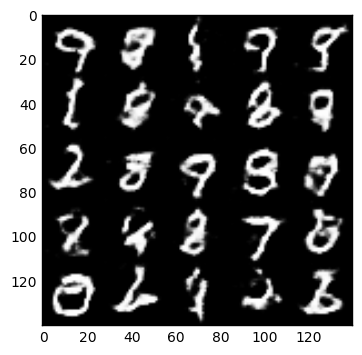

epoch 2 d_loss 1.3724708557128906 g_loss 0.7917467355728149
epoch 2 d_loss 1.367945909500122 g_loss 0.7718955278396606
epoch 2 d_loss 1.3574185371398926 g_loss 0.775177001953125
epoch 2 d_loss 1.3906217813491821 g_loss 0.8191158175468445
epoch 2 d_loss 1.3753726482391357 g_loss 0.8523584604263306
epoch 2 d_loss 1.3638746738433838 g_loss 0.7834272384643555
epoch 2 d_loss 1.354612112045288 g_loss 0.8220897912979126
epoch 2 d_loss 1.3580889701843262 g_loss 0.7769649624824524
epoch 2 d_loss 1.3285181522369385 g_loss 0.7745386362075806
epoch 2 d_loss 1.3568603992462158 g_loss 0.8483421802520752


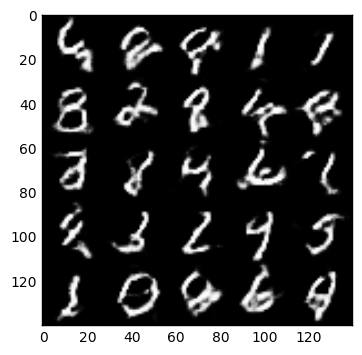

epoch 2 d_loss 1.3824090957641602 g_loss 0.7984728217124939
epoch 2 d_loss 1.3638944625854492 g_loss 0.8023425340652466
epoch 2 d_loss 1.3598562479019165 g_loss 0.8306272029876709
epoch 2 d_loss 1.4042608737945557 g_loss 0.7956663966178894
epoch 2 d_loss 1.353684425354004 g_loss 0.837475061416626
epoch 2 d_loss 1.403793454170227 g_loss 0.810232400894165
epoch 2 d_loss 1.3674713373184204 g_loss 0.7585290670394897
epoch 2 d_loss 1.3899601697921753 g_loss 0.7799261808395386
epoch 2 d_loss 1.347818374633789 g_loss 0.8172993063926697
epoch 2 d_loss 1.3502922058105469 g_loss 0.7357124090194702


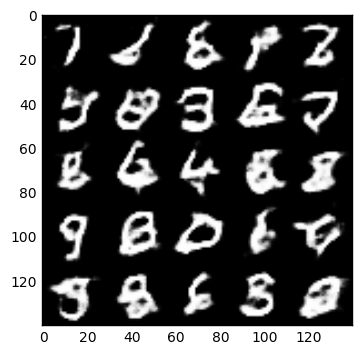

epoch 2 d_loss 1.375691533088684 g_loss 0.8460984230041504
epoch 2 d_loss 1.3816200494766235 g_loss 0.7458256483078003
epoch 2 d_loss 1.3810608386993408 g_loss 0.7865220308303833
epoch 2 d_loss 1.3581780195236206 g_loss 0.8493693470954895
epoch 2 d_loss 1.3875032663345337 g_loss 0.8337482810020447
epoch 2 d_loss 1.3775547742843628 g_loss 0.7856564521789551
epoch 2 d_loss 1.3902406692504883 g_loss 0.7755932807922363


In [43]:
batch_size = 64
z_dim = 100
learning_rate = 0.0003
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

epoch 1 d_loss 1.3335741758346558 g_loss 0.8231246471405029
epoch 1 d_loss 1.2814021110534668 g_loss 0.9898700714111328
epoch 1 d_loss 1.2756690979003906 g_loss 1.0574700832366943
epoch 1 d_loss 1.2896963357925415 g_loss 0.9070467948913574
epoch 1 d_loss 1.3239809274673462 g_loss 0.853750467300415
epoch 1 d_loss 1.1561400890350342 g_loss 0.9805890321731567
epoch 1 d_loss 1.225818395614624 g_loss 0.8952240347862244
epoch 1 d_loss 1.2930625677108765 g_loss 0.9893726706504822
epoch 1 d_loss 1.3790229558944702 g_loss 0.8196228742599487
epoch 1 d_loss 1.1577064990997314 g_loss 0.9584776759147644


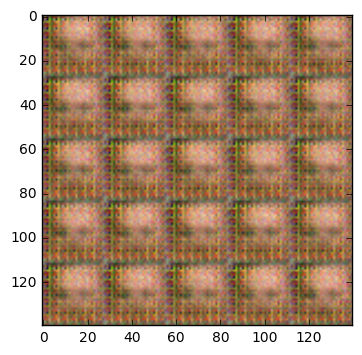

epoch 1 d_loss 1.154171109199524 g_loss 1.0207561254501343
epoch 1 d_loss 1.4046125411987305 g_loss 0.8839080333709717
epoch 1 d_loss 1.5670603513717651 g_loss 0.5603799223899841
epoch 1 d_loss 1.5699262619018555 g_loss 0.7353274822235107
epoch 1 d_loss 1.2753944396972656 g_loss 0.8424009084701538
epoch 1 d_loss 1.0351051092147827 g_loss 1.1333385705947876
epoch 1 d_loss 1.2768691778182983 g_loss 1.015929937362671
epoch 1 d_loss 1.3065319061279297 g_loss 0.9267329573631287
epoch 1 d_loss 1.3112459182739258 g_loss 0.8948633670806885
epoch 1 d_loss 1.1199020147323608 g_loss 1.1689823865890503


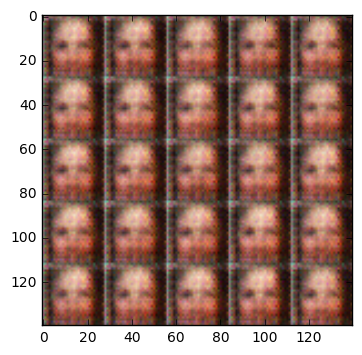

epoch 1 d_loss 1.3307485580444336 g_loss 0.8936251997947693
epoch 1 d_loss 1.289434790611267 g_loss 0.9640328884124756
epoch 1 d_loss 1.5220634937286377 g_loss 0.8184622526168823
epoch 1 d_loss 1.1605230569839478 g_loss 1.1043262481689453
epoch 1 d_loss 1.3415172100067139 g_loss 0.8944542407989502
epoch 1 d_loss 1.1265172958374023 g_loss 1.0259603261947632
epoch 1 d_loss 1.2134017944335938 g_loss 1.1239683628082275
epoch 1 d_loss 1.4213460683822632 g_loss 0.7886942625045776
epoch 1 d_loss 1.2360706329345703 g_loss 1.1055095195770264
epoch 1 d_loss 1.1335558891296387 g_loss 1.0932981967926025


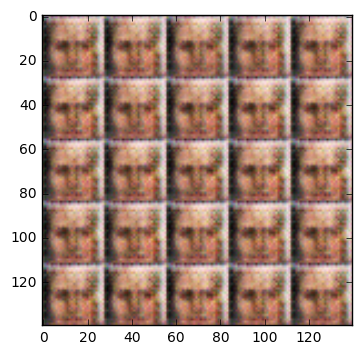

epoch 1 d_loss 1.4774739742279053 g_loss 0.8111276626586914
epoch 1 d_loss 1.3396410942077637 g_loss 0.7979692220687866
epoch 1 d_loss 1.1136105060577393 g_loss 1.14388108253479
epoch 1 d_loss 1.02254319190979 g_loss 1.2980828285217285
epoch 1 d_loss 0.9845249056816101 g_loss 1.209302306175232
epoch 1 d_loss 1.2952790260314941 g_loss 1.6212997436523438
epoch 1 d_loss 0.9812042713165283 g_loss 1.215015172958374
epoch 1 d_loss 1.1928088665008545 g_loss 0.9912278652191162
epoch 1 d_loss 0.8795081377029419 g_loss 1.3415582180023193
epoch 1 d_loss 1.0232713222503662 g_loss 1.159332036972046


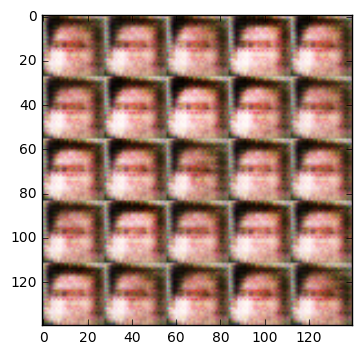

epoch 1 d_loss 1.0352890491485596 g_loss 1.2270246744155884
epoch 1 d_loss 1.4093375205993652 g_loss 0.7105015516281128
epoch 1 d_loss 1.2842481136322021 g_loss 1.1143521070480347
epoch 1 d_loss 1.3432426452636719 g_loss 0.9302226901054382
epoch 1 d_loss 1.3293037414550781 g_loss 0.9209257960319519
epoch 1 d_loss 1.1941912174224854 g_loss 1.0664277076721191
epoch 1 d_loss 1.0952653884887695 g_loss 1.055840253829956
epoch 1 d_loss 1.1028618812561035 g_loss 0.9764670729637146
epoch 1 d_loss 1.2492997646331787 g_loss 1.0524784326553345
epoch 1 d_loss 1.3133740425109863 g_loss 1.0894651412963867


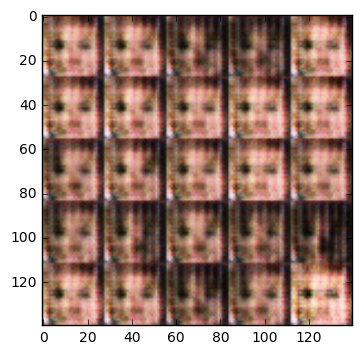

epoch 1 d_loss 1.2784380912780762 g_loss 1.0367038249969482
epoch 1 d_loss 1.4107388257980347 g_loss 0.8351404070854187
epoch 1 d_loss 1.1328248977661133 g_loss 0.948952317237854
epoch 1 d_loss 1.3392040729522705 g_loss 0.8170889019966125
epoch 1 d_loss 1.44341242313385 g_loss 0.829255223274231
epoch 1 d_loss 1.2639095783233643 g_loss 0.9405081272125244
epoch 1 d_loss 1.3139344453811646 g_loss 0.7722262144088745
epoch 1 d_loss 1.2516963481903076 g_loss 0.912473201751709
epoch 1 d_loss 1.1663331985473633 g_loss 1.0087666511535645
epoch 1 d_loss 1.201921820640564 g_loss 1.0011221170425415


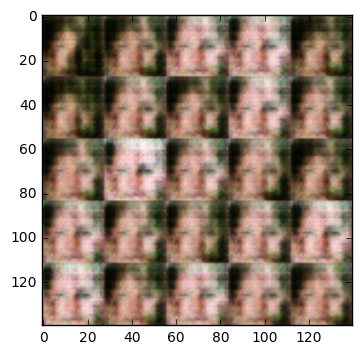

epoch 1 d_loss 1.215279459953308 g_loss 0.8901815414428711
epoch 1 d_loss 1.1140615940093994 g_loss 1.0015612840652466
epoch 1 d_loss 1.380661964416504 g_loss 0.835163950920105
epoch 1 d_loss 1.2203257083892822 g_loss 1.0129003524780273
epoch 1 d_loss 1.2451732158660889 g_loss 1.022855281829834
epoch 1 d_loss 1.430469274520874 g_loss 0.7899370193481445
epoch 1 d_loss 1.193576693534851 g_loss 0.9511198997497559
epoch 1 d_loss 1.2087736129760742 g_loss 0.9494103789329529
epoch 1 d_loss 1.155479907989502 g_loss 0.9191683530807495
epoch 1 d_loss 1.1559011936187744 g_loss 0.9086107015609741


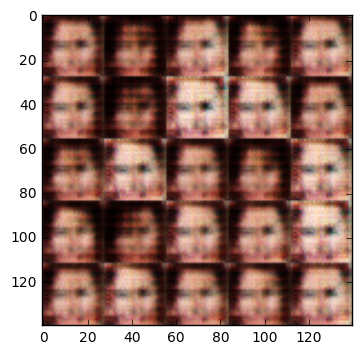

epoch 1 d_loss 1.1868927478790283 g_loss 1.1337822675704956
epoch 1 d_loss 1.1129323244094849 g_loss 1.0549919605255127
epoch 1 d_loss 1.293684959411621 g_loss 0.9609106779098511
epoch 1 d_loss 1.2430051565170288 g_loss 0.9651222229003906
epoch 1 d_loss 1.2621010541915894 g_loss 0.9417272806167603
epoch 1 d_loss 1.446566104888916 g_loss 0.8070902824401855
epoch 1 d_loss 1.2140065431594849 g_loss 0.9439271688461304
epoch 1 d_loss 0.9775938987731934 g_loss 1.1604317426681519
epoch 1 d_loss 1.2925608158111572 g_loss 0.9125584363937378
epoch 1 d_loss 1.2829324007034302 g_loss 0.8705732822418213


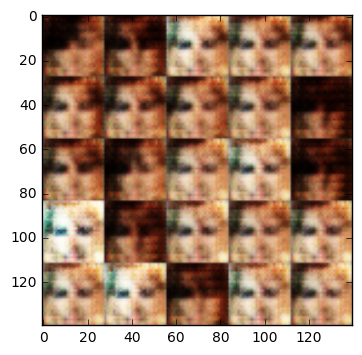

epoch 1 d_loss 1.0518059730529785 g_loss 1.0821795463562012
epoch 1 d_loss 1.1798779964447021 g_loss 1.192393183708191
epoch 1 d_loss 1.3082118034362793 g_loss 0.7733117341995239
epoch 1 d_loss 1.313679575920105 g_loss 1.001206636428833
epoch 1 d_loss 1.1603937149047852 g_loss 1.0882437229156494
epoch 1 d_loss 1.2811601161956787 g_loss 1.0182396173477173
epoch 1 d_loss 1.347491979598999 g_loss 0.8319389820098877
epoch 1 d_loss 1.3100035190582275 g_loss 0.9448444843292236
epoch 1 d_loss 1.3240482807159424 g_loss 0.9312504529953003
epoch 1 d_loss 1.3648518323898315 g_loss 0.7680842876434326


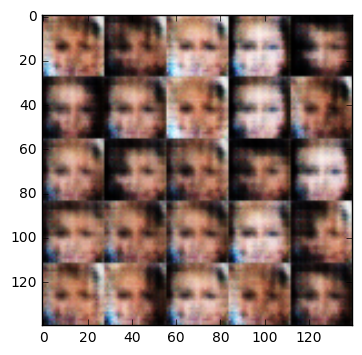

epoch 1 d_loss 1.3475749492645264 g_loss 0.855533242225647
epoch 1 d_loss 1.322256326675415 g_loss 1.0529993772506714
epoch 1 d_loss 1.3513514995574951 g_loss 0.8823814392089844
epoch 1 d_loss 1.272348403930664 g_loss 0.9035297632217407
epoch 1 d_loss 1.2884223461151123 g_loss 0.9347661733627319
epoch 1 d_loss 1.3258397579193115 g_loss 0.9699621200561523
epoch 1 d_loss 1.292755126953125 g_loss 0.882694661617279
epoch 1 d_loss 1.4399495124816895 g_loss 0.7603463530540466
epoch 1 d_loss 1.2552342414855957 g_loss 0.8250728845596313
epoch 1 d_loss 1.4005634784698486 g_loss 0.8460267782211304


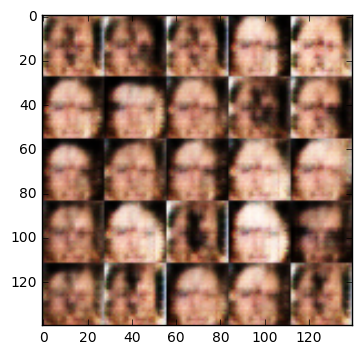

epoch 1 d_loss 1.3170807361602783 g_loss 0.888500452041626
epoch 1 d_loss 1.3268359899520874 g_loss 0.777783989906311
epoch 1 d_loss 1.226503610610962 g_loss 0.7695248126983643
epoch 1 d_loss 1.3519344329833984 g_loss 0.8821569681167603
epoch 1 d_loss 1.3137953281402588 g_loss 0.8435618877410889
epoch 1 d_loss 1.3225781917572021 g_loss 0.8664804697036743
epoch 1 d_loss 1.3441710472106934 g_loss 0.8147836327552795
epoch 1 d_loss 1.286650538444519 g_loss 0.997722327709198
epoch 1 d_loss 1.3939236402511597 g_loss 0.8503944873809814
epoch 1 d_loss 1.3100695610046387 g_loss 0.9377073049545288


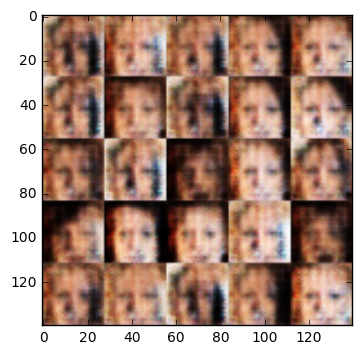

epoch 1 d_loss 1.3526506423950195 g_loss 0.7526053190231323
epoch 1 d_loss 1.2046260833740234 g_loss 0.8906958699226379
epoch 1 d_loss 1.4287030696868896 g_loss 0.7532880306243896
epoch 1 d_loss 1.3120720386505127 g_loss 0.8152093887329102
epoch 1 d_loss 1.3175394535064697 g_loss 0.8593276739120483
epoch 1 d_loss 1.2151148319244385 g_loss 0.9308615922927856
epoch 1 d_loss 1.33610200881958 g_loss 0.8622528910636902
epoch 1 d_loss 1.39029860496521 g_loss 0.7581785917282104
epoch 1 d_loss 1.2721023559570312 g_loss 0.9246124029159546
epoch 1 d_loss 1.2701220512390137 g_loss 0.888820230960846


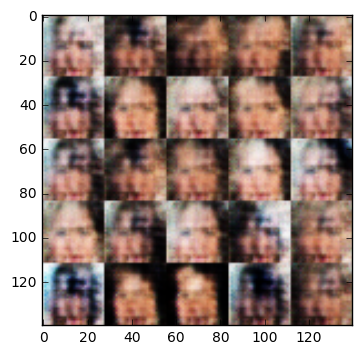

epoch 1 d_loss 1.3138633966445923 g_loss 1.0136408805847168
epoch 1 d_loss 1.3262724876403809 g_loss 0.8931734561920166
epoch 1 d_loss 1.2614543437957764 g_loss 0.8813234567642212
epoch 1 d_loss 1.3642127513885498 g_loss 0.754879891872406
epoch 1 d_loss 1.3874094486236572 g_loss 0.9653046131134033
epoch 1 d_loss 1.313749074935913 g_loss 0.8183197975158691
epoch 1 d_loss 1.4073803424835205 g_loss 0.864201545715332
epoch 1 d_loss 1.3529834747314453 g_loss 0.8385177850723267
epoch 1 d_loss 1.2899484634399414 g_loss 0.9550536274909973
epoch 1 d_loss 1.3716853857040405 g_loss 0.8744141459465027


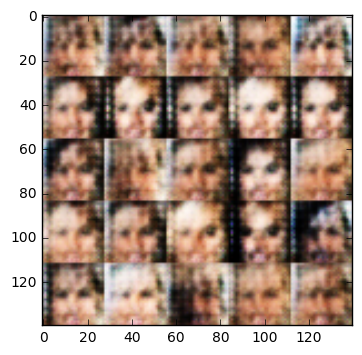

epoch 1 d_loss 1.3436161279678345 g_loss 0.8571454286575317
epoch 1 d_loss 1.3322826623916626 g_loss 0.7596724033355713
epoch 1 d_loss 1.26192307472229 g_loss 0.8571567535400391
epoch 1 d_loss 1.3636653423309326 g_loss 0.7700125575065613
epoch 1 d_loss 1.3008699417114258 g_loss 0.864703357219696
epoch 1 d_loss 1.329042673110962 g_loss 0.8001288175582886
epoch 1 d_loss 1.3494465351104736 g_loss 0.780204713344574
epoch 1 d_loss 1.2824249267578125 g_loss 0.8286639451980591
epoch 1 d_loss 1.3088057041168213 g_loss 0.7803163528442383
epoch 1 d_loss 1.3673580884933472 g_loss 0.8744412660598755


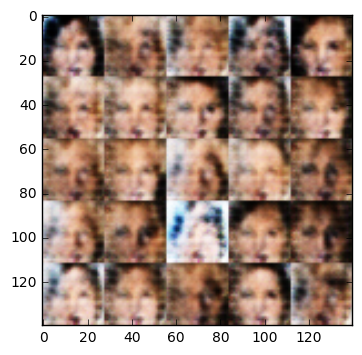

epoch 1 d_loss 1.414776086807251 g_loss 0.8220752477645874
epoch 1 d_loss 1.3896214962005615 g_loss 0.8487831950187683
epoch 1 d_loss 1.3703727722167969 g_loss 0.8234941959381104
epoch 1 d_loss 1.3419578075408936 g_loss 0.9078323245048523
epoch 1 d_loss 1.2830791473388672 g_loss 0.8116081953048706
epoch 1 d_loss 1.4140353202819824 g_loss 0.8451914191246033
epoch 1 d_loss 1.3303110599517822 g_loss 0.8492234945297241
epoch 1 d_loss 1.267307996749878 g_loss 0.8036059141159058
epoch 1 d_loss 1.3420472145080566 g_loss 0.8269011974334717
epoch 1 d_loss 1.302584171295166 g_loss 0.8633623719215393


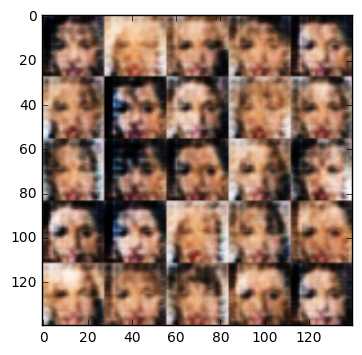

epoch 1 d_loss 1.3514485359191895 g_loss 0.8440536260604858
epoch 1 d_loss 1.3595130443572998 g_loss 0.876926064491272
epoch 1 d_loss 1.3733484745025635 g_loss 0.8952819108963013
epoch 1 d_loss 1.3557953834533691 g_loss 0.8309046626091003
epoch 1 d_loss 1.3971736431121826 g_loss 0.8529098033905029
epoch 1 d_loss 1.3973369598388672 g_loss 0.7916394472122192
epoch 1 d_loss 1.3548192977905273 g_loss 0.8303370475769043
epoch 1 d_loss 1.3044397830963135 g_loss 0.8117108345031738
epoch 1 d_loss 1.3660345077514648 g_loss 0.8510208129882812
epoch 1 d_loss 1.387427806854248 g_loss 0.7770859003067017


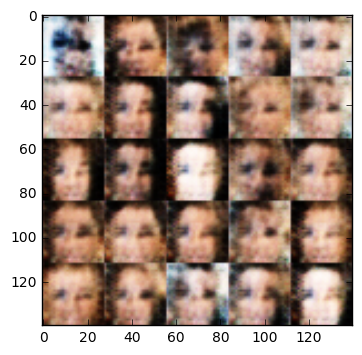

epoch 1 d_loss 1.3484159708023071 g_loss 0.9781956076622009
epoch 1 d_loss 1.2713372707366943 g_loss 0.8474785089492798
epoch 1 d_loss 1.4236209392547607 g_loss 0.8440530300140381
epoch 1 d_loss 1.3455653190612793 g_loss 0.8637927174568176
epoch 1 d_loss 1.2826142311096191 g_loss 0.8380494713783264
epoch 1 d_loss 1.3858031034469604 g_loss 0.8451060056686401
epoch 1 d_loss 1.366821050643921 g_loss 0.8069748878479004
epoch 1 d_loss 1.361067771911621 g_loss 0.9269155263900757
epoch 1 d_loss 1.3133376836776733 g_loss 0.8011804223060608
epoch 1 d_loss 1.2865638732910156 g_loss 0.7979758381843567


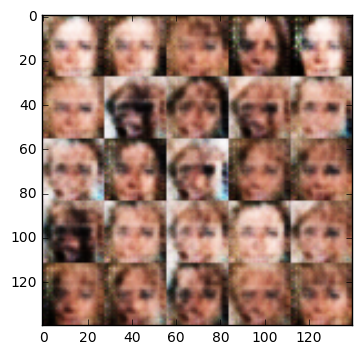

epoch 1 d_loss 1.3503494262695312 g_loss 0.8325163125991821
epoch 1 d_loss 1.3666386604309082 g_loss 0.7474611401557922
epoch 1 d_loss 1.3260225057601929 g_loss 0.8462983965873718
epoch 1 d_loss 1.3140504360198975 g_loss 0.853583574295044
epoch 1 d_loss 1.3526684045791626 g_loss 0.8761289119720459
epoch 1 d_loss 1.3245148658752441 g_loss 0.8284533023834229
epoch 1 d_loss 1.3768901824951172 g_loss 0.7935795187950134
epoch 1 d_loss 1.242362141609192 g_loss 0.8597981929779053
epoch 1 d_loss 1.302404522895813 g_loss 0.7523722648620605
epoch 1 d_loss 1.3781044483184814 g_loss 0.8851852416992188


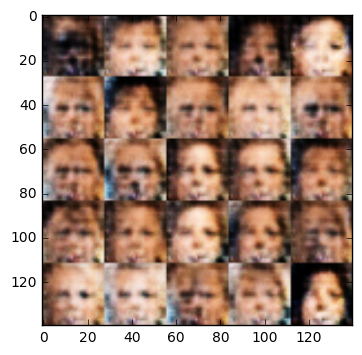

epoch 1 d_loss 1.3260654211044312 g_loss 0.8526513576507568
epoch 1 d_loss 1.286633014678955 g_loss 0.8272057771682739
epoch 1 d_loss 1.2011101245880127 g_loss 1.0323936939239502
epoch 1 d_loss 1.28056800365448 g_loss 0.8845213651657104
epoch 1 d_loss 1.3299131393432617 g_loss 0.8984116911888123
epoch 1 d_loss 1.3301424980163574 g_loss 0.8784751892089844
epoch 1 d_loss 1.3275573253631592 g_loss 0.8086065649986267
epoch 1 d_loss 1.3707000017166138 g_loss 0.8613982200622559
epoch 1 d_loss 1.3976795673370361 g_loss 0.856523334980011
epoch 1 d_loss 1.377177119255066 g_loss 0.8641452789306641


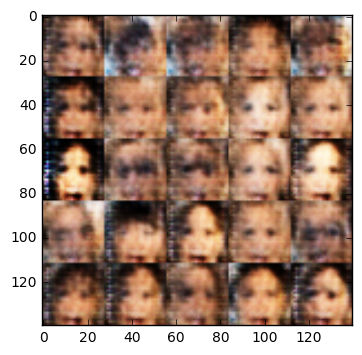

epoch 1 d_loss 1.3704042434692383 g_loss 0.8273468017578125
epoch 1 d_loss 1.3253307342529297 g_loss 0.8434677124023438
epoch 1 d_loss 1.3905789852142334 g_loss 0.7504062056541443
epoch 1 d_loss 1.3654825687408447 g_loss 0.8702006340026855
epoch 1 d_loss 1.306617021560669 g_loss 0.8545882701873779
epoch 1 d_loss 1.3522288799285889 g_loss 0.8318370580673218
epoch 1 d_loss 1.3520015478134155 g_loss 0.8542904853820801
epoch 1 d_loss 1.363373875617981 g_loss 0.832445502281189
epoch 1 d_loss 1.3300734758377075 g_loss 0.7820349931716919
epoch 1 d_loss 1.3923338651657104 g_loss 0.8199339509010315


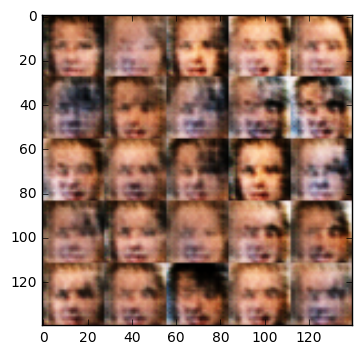

epoch 1 d_loss 1.35099458694458 g_loss 0.8734754920005798
epoch 1 d_loss 1.3583271503448486 g_loss 0.7986346483230591
epoch 1 d_loss 1.386061668395996 g_loss 0.8205713033676147
epoch 1 d_loss 1.377685308456421 g_loss 0.8017057776451111
epoch 1 d_loss 1.3906701803207397 g_loss 0.8534310460090637
epoch 1 d_loss 1.3925756216049194 g_loss 0.8222280740737915
epoch 1 d_loss 1.3363351821899414 g_loss 0.876165509223938
epoch 1 d_loss 1.370237946510315 g_loss 0.8027834892272949
epoch 1 d_loss 1.3264427185058594 g_loss 0.8216778039932251
epoch 1 d_loss 1.3611199855804443 g_loss 0.812978982925415


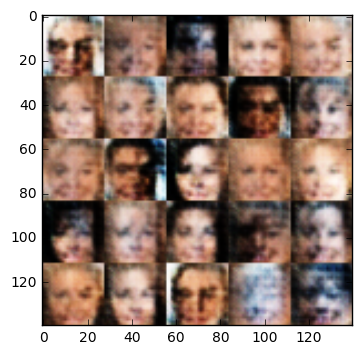

epoch 1 d_loss 1.392530918121338 g_loss 0.7989431619644165
epoch 1 d_loss 1.397977590560913 g_loss 0.852256715297699
epoch 1 d_loss 1.3668564558029175 g_loss 0.8297044038772583
epoch 1 d_loss 1.344527006149292 g_loss 0.8518408536911011
epoch 1 d_loss 1.3995639085769653 g_loss 0.8247479796409607
epoch 1 d_loss 1.3776018619537354 g_loss 0.7943903803825378
epoch 1 d_loss 1.304816484451294 g_loss 0.8316652774810791
epoch 1 d_loss 1.3557124137878418 g_loss 0.8304275274276733
epoch 1 d_loss 1.4047961235046387 g_loss 0.7880527973175049
epoch 1 d_loss 1.3610787391662598 g_loss 0.8164751529693604


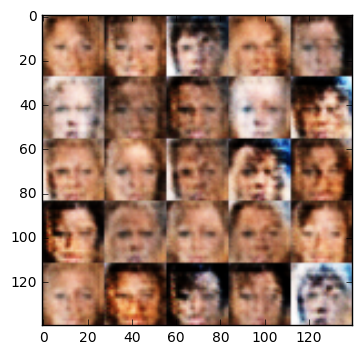

epoch 1 d_loss 1.3471636772155762 g_loss 0.8240737915039062
epoch 1 d_loss 1.3530290126800537 g_loss 0.7900439500808716
epoch 1 d_loss 1.3835265636444092 g_loss 0.8244572877883911
epoch 1 d_loss 1.365647792816162 g_loss 0.8610326051712036
epoch 1 d_loss 1.4026453495025635 g_loss 0.7850216627120972
epoch 1 d_loss 1.3529376983642578 g_loss 0.7989620566368103
epoch 1 d_loss 1.34757399559021 g_loss 0.7692314982414246
epoch 1 d_loss 1.3784682750701904 g_loss 0.8415274024009705
epoch 1 d_loss 1.3955671787261963 g_loss 0.8263791799545288
epoch 1 d_loss 1.3646889925003052 g_loss 0.7844156622886658


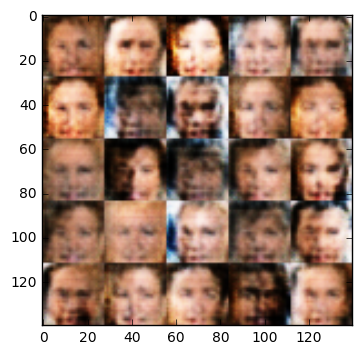

epoch 1 d_loss 1.3759242296218872 g_loss 0.8046787977218628
epoch 1 d_loss 1.3170411586761475 g_loss 0.8474510908126831
epoch 1 d_loss 1.3743996620178223 g_loss 0.8454651236534119
epoch 1 d_loss 1.3549513816833496 g_loss 0.784797191619873
epoch 1 d_loss 1.3479914665222168 g_loss 0.7871885895729065
epoch 1 d_loss 1.3681235313415527 g_loss 0.7762303948402405
epoch 1 d_loss 1.3875963687896729 g_loss 0.7746164798736572
epoch 1 d_loss 1.3394813537597656 g_loss 0.8372004628181458
epoch 1 d_loss 1.4021426439285278 g_loss 0.798491358757019
epoch 1 d_loss 1.397301435470581 g_loss 0.8039963841438293


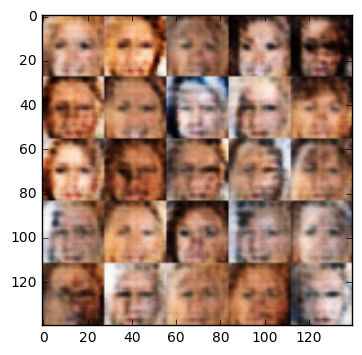

epoch 1 d_loss 1.3530173301696777 g_loss 0.8018447756767273
epoch 1 d_loss 1.3678181171417236 g_loss 0.8076983094215393
epoch 1 d_loss 1.361302375793457 g_loss 0.8193088173866272
epoch 1 d_loss 1.3621561527252197 g_loss 0.8149099349975586
epoch 1 d_loss 1.393052101135254 g_loss 0.7835432887077332
epoch 1 d_loss 1.3264809846878052 g_loss 0.8717471361160278
epoch 1 d_loss 1.392366647720337 g_loss 0.7981314659118652
epoch 1 d_loss 1.3764197826385498 g_loss 0.8072837591171265
epoch 1 d_loss 1.3248934745788574 g_loss 0.8019223213195801
epoch 1 d_loss 1.3615093231201172 g_loss 0.8142817616462708


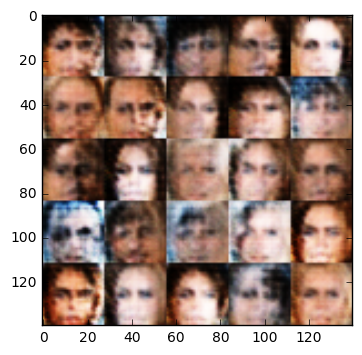

epoch 1 d_loss 1.374255895614624 g_loss 0.7937313318252563
epoch 1 d_loss 1.339176893234253 g_loss 0.8236293196678162
epoch 1 d_loss 1.3573639392852783 g_loss 0.8133516311645508
epoch 1 d_loss 1.3654898405075073 g_loss 0.8059593439102173
epoch 1 d_loss 1.3724273443222046 g_loss 0.8068677186965942
epoch 1 d_loss 1.3447132110595703 g_loss 0.8126639127731323
epoch 1 d_loss 1.3792052268981934 g_loss 0.7968132495880127
epoch 1 d_loss 1.3920872211456299 g_loss 0.769619345664978
epoch 1 d_loss 1.3881490230560303 g_loss 0.8194416165351868
epoch 1 d_loss 1.3637303113937378 g_loss 0.8072752952575684


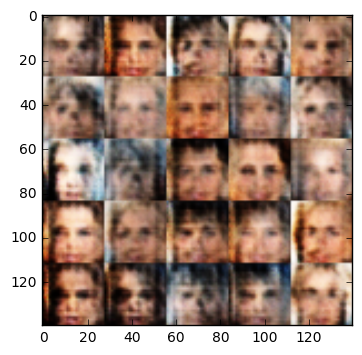

epoch 1 d_loss 1.370233178138733 g_loss 0.8078763484954834
epoch 1 d_loss 1.3774890899658203 g_loss 0.8110190629959106
epoch 1 d_loss 1.3831660747528076 g_loss 0.799605667591095
epoch 1 d_loss 1.387902021408081 g_loss 0.830176055431366
epoch 1 d_loss 1.390512466430664 g_loss 0.8244419693946838
epoch 1 d_loss 1.385690450668335 g_loss 0.7876073718070984
epoch 1 d_loss 1.3780959844589233 g_loss 0.7907965183258057
epoch 1 d_loss 1.385908842086792 g_loss 0.7830337285995483
epoch 1 d_loss 1.3755946159362793 g_loss 0.8110906481742859
epoch 1 d_loss 1.3483855724334717 g_loss 0.812286376953125


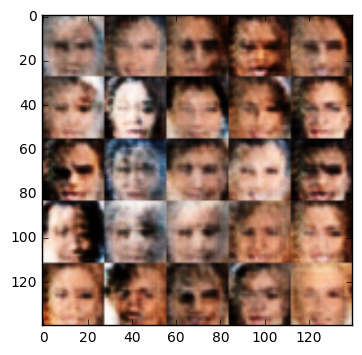

epoch 1 d_loss 1.3928897380828857 g_loss 0.8197846412658691
epoch 1 d_loss 1.378967046737671 g_loss 0.7780575752258301
epoch 1 d_loss 1.3782298564910889 g_loss 0.8144040703773499
epoch 1 d_loss 1.3817057609558105 g_loss 0.8536959886550903
epoch 1 d_loss 1.3719048500061035 g_loss 0.7985778450965881
epoch 1 d_loss 1.3638074398040771 g_loss 0.800208568572998
epoch 1 d_loss 1.3771543502807617 g_loss 0.8112413883209229
epoch 1 d_loss 1.340976357460022 g_loss 0.8089326024055481
epoch 1 d_loss 1.355452060699463 g_loss 0.7961038947105408
epoch 1 d_loss 1.4094527959823608 g_loss 0.7684735059738159


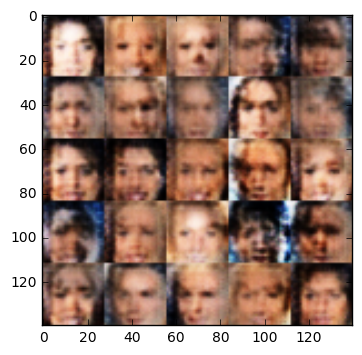

epoch 1 d_loss 1.3963613510131836 g_loss 0.7873129844665527
epoch 1 d_loss 1.4313039779663086 g_loss 0.787004828453064
epoch 1 d_loss 1.3698930740356445 g_loss 0.8008461594581604
epoch 1 d_loss 1.388411283493042 g_loss 0.8241502046585083
epoch 1 d_loss 1.3656363487243652 g_loss 0.7599155902862549
epoch 1 d_loss 1.3573553562164307 g_loss 0.8115851879119873
epoch 1 d_loss 1.3747904300689697 g_loss 0.8307671546936035
epoch 1 d_loss 1.365344524383545 g_loss 0.8151911497116089
epoch 1 d_loss 1.3346360921859741 g_loss 0.7775538563728333
epoch 1 d_loss 1.3633837699890137 g_loss 0.8207869529724121


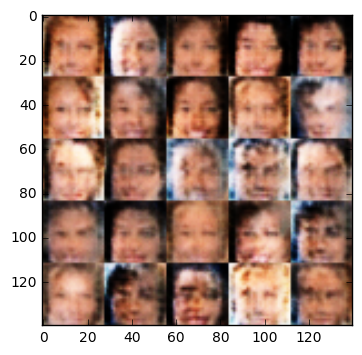

epoch 1 d_loss 1.3733373880386353 g_loss 0.7987644672393799
epoch 1 d_loss 1.3480743169784546 g_loss 0.818810224533081
epoch 1 d_loss 1.3748786449432373 g_loss 0.8044611215591431
epoch 1 d_loss 1.3649158477783203 g_loss 0.8089102506637573
epoch 1 d_loss 1.3792742490768433 g_loss 0.8320108652114868
epoch 1 d_loss 1.3677067756652832 g_loss 0.7763867378234863
epoch 1 d_loss 1.3786762952804565 g_loss 0.846255362033844
epoch 1 d_loss 1.3894987106323242 g_loss 0.8310476541519165
epoch 1 d_loss 1.3851873874664307 g_loss 0.7812047004699707
epoch 1 d_loss 1.3771610260009766 g_loss 0.7953569889068604


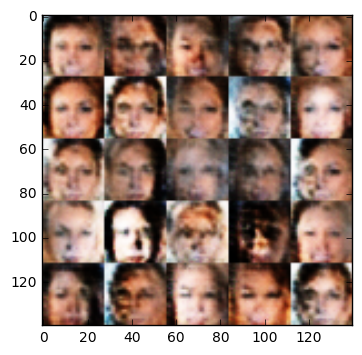

epoch 1 d_loss 1.3676273822784424 g_loss 0.818761944770813
epoch 1 d_loss 1.3842804431915283 g_loss 0.7992833852767944
epoch 1 d_loss 1.3550176620483398 g_loss 0.7772382497787476
epoch 1 d_loss 1.3695180416107178 g_loss 0.8258137702941895
epoch 1 d_loss 1.3709614276885986 g_loss 0.8522070646286011
epoch 1 d_loss 1.3787730932235718 g_loss 0.7897557616233826
epoch 1 d_loss 1.3712244033813477 g_loss 0.7991238236427307
epoch 1 d_loss 1.3564233779907227 g_loss 0.7937072515487671
epoch 1 d_loss 1.3790948390960693 g_loss 0.8300408124923706
epoch 1 d_loss 1.3965320587158203 g_loss 0.7555720806121826


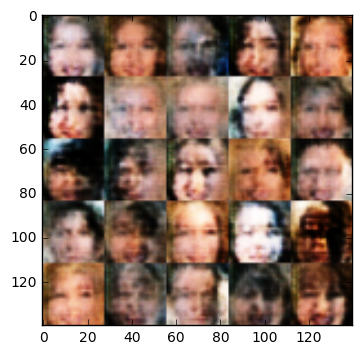

epoch 1 d_loss 1.3600560426712036 g_loss 0.8083469271659851
epoch 1 d_loss 1.3718433380126953 g_loss 0.813163161277771
epoch 1 d_loss 1.3381121158599854 g_loss 0.8000612258911133
epoch 1 d_loss 1.4024038314819336 g_loss 0.8136814832687378
epoch 1 d_loss 1.3624789714813232 g_loss 0.8525411486625671
epoch 1 d_loss 1.3667528629302979 g_loss 0.7817795872688293
epoch 2 d_loss 1.3754925727844238 g_loss 0.7952717542648315
epoch 2 d_loss 1.3504555225372314 g_loss 0.8577460050582886
epoch 2 d_loss 1.368787407875061 g_loss 0.7592936754226685
epoch 2 d_loss 1.359743356704712 g_loss 0.8162556886672974


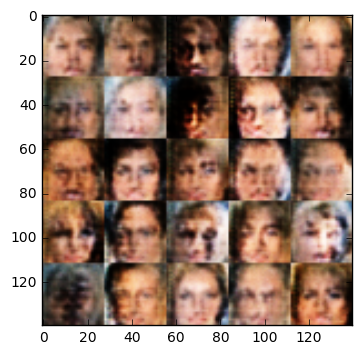

epoch 2 d_loss 1.3566980361938477 g_loss 0.8170239925384521
epoch 2 d_loss 1.3441357612609863 g_loss 0.8293038606643677
epoch 2 d_loss 1.3678244352340698 g_loss 0.8074890375137329
epoch 2 d_loss 1.3830249309539795 g_loss 0.726897120475769
epoch 2 d_loss 1.382508397102356 g_loss 0.8374167680740356
epoch 2 d_loss 1.359771728515625 g_loss 0.7796052098274231
epoch 2 d_loss 1.4118515253067017 g_loss 0.8297996520996094
epoch 2 d_loss 1.3733466863632202 g_loss 0.8232861757278442
epoch 2 d_loss 1.3592033386230469 g_loss 0.8282318115234375
epoch 2 d_loss 1.381456971168518 g_loss 0.7911404371261597


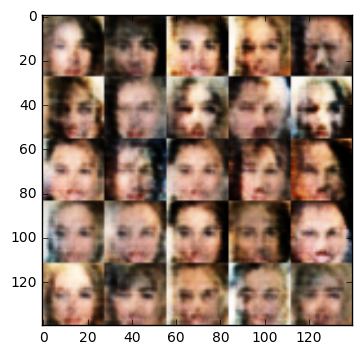

epoch 2 d_loss 1.3686151504516602 g_loss 0.8036540746688843
epoch 2 d_loss 1.3760733604431152 g_loss 0.7902476787567139
epoch 2 d_loss 1.379804015159607 g_loss 0.7944485545158386
epoch 2 d_loss 1.3748385906219482 g_loss 0.8035873174667358
epoch 2 d_loss 1.376752257347107 g_loss 0.8364500403404236
epoch 2 d_loss 1.3684024810791016 g_loss 0.7903351783752441
epoch 2 d_loss 1.3744200468063354 g_loss 0.7523929476737976
epoch 2 d_loss 1.3785924911499023 g_loss 0.8641066551208496
epoch 2 d_loss 1.387844204902649 g_loss 0.7444307804107666
epoch 2 d_loss 1.3605108261108398 g_loss 0.8727390766143799


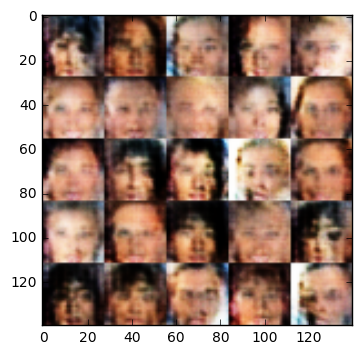

epoch 2 d_loss 1.3758325576782227 g_loss 0.782051682472229
epoch 2 d_loss 1.3757119178771973 g_loss 0.8126324415206909
epoch 2 d_loss 1.3347506523132324 g_loss 0.8537068367004395
epoch 2 d_loss 1.3546152114868164 g_loss 0.7998340129852295
epoch 2 d_loss 1.359559416770935 g_loss 0.8422672152519226
epoch 2 d_loss 1.3758571147918701 g_loss 0.8107542991638184
epoch 2 d_loss 1.3764351606369019 g_loss 0.7848631739616394
epoch 2 d_loss 1.3681244850158691 g_loss 0.8098080158233643
epoch 2 d_loss 1.391250491142273 g_loss 0.8386614322662354
epoch 2 d_loss 1.3680317401885986 g_loss 0.7746618390083313


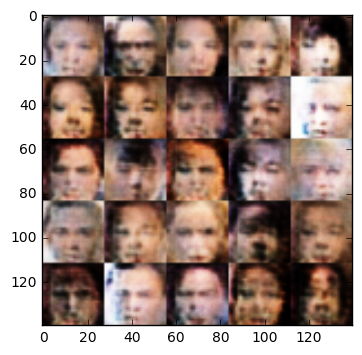

epoch 2 d_loss 1.3924726247787476 g_loss 0.7884336709976196
epoch 2 d_loss 1.3647512197494507 g_loss 0.8475852608680725
epoch 2 d_loss 1.3620247840881348 g_loss 0.7969396114349365
epoch 2 d_loss 1.3879070281982422 g_loss 0.8669442534446716
epoch 2 d_loss 1.3787490129470825 g_loss 0.8048635125160217
epoch 2 d_loss 1.364377498626709 g_loss 0.7596689462661743
epoch 2 d_loss 1.3777210712432861 g_loss 0.8588513135910034
epoch 2 d_loss 1.3861753940582275 g_loss 0.8026858568191528
epoch 2 d_loss 1.3606700897216797 g_loss 0.7844611406326294
epoch 2 d_loss 1.3822333812713623 g_loss 0.8284292817115784


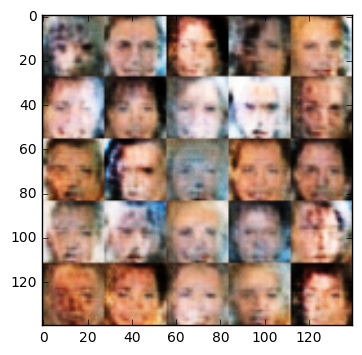

epoch 2 d_loss 1.362928867340088 g_loss 0.8232746124267578
epoch 2 d_loss 1.365623950958252 g_loss 0.7988253831863403
epoch 2 d_loss 1.3736809492111206 g_loss 0.7823675870895386
epoch 2 d_loss 1.3602259159088135 g_loss 0.8168760538101196
epoch 2 d_loss 1.37786865234375 g_loss 0.8218000531196594
epoch 2 d_loss 1.3914504051208496 g_loss 0.8354712724685669
epoch 2 d_loss 1.3663005828857422 g_loss 0.7918888330459595
epoch 2 d_loss 1.3375253677368164 g_loss 0.7782301902770996
epoch 2 d_loss 1.3674437999725342 g_loss 0.773776650428772
epoch 2 d_loss 1.3954477310180664 g_loss 0.8464783430099487


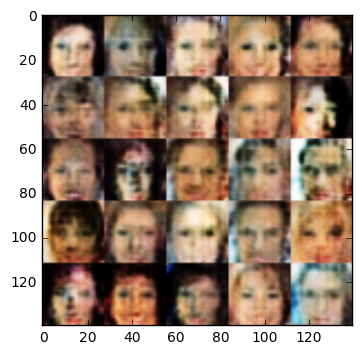

epoch 2 d_loss 1.3728190660476685 g_loss 0.7895017862319946
epoch 2 d_loss 1.381227970123291 g_loss 0.8055893182754517
epoch 2 d_loss 1.3561878204345703 g_loss 0.781349241733551
epoch 2 d_loss 1.3453168869018555 g_loss 0.8268480896949768
epoch 2 d_loss 1.387002944946289 g_loss 0.7880188226699829
epoch 2 d_loss 1.3626105785369873 g_loss 0.8253704905509949
epoch 2 d_loss 1.358900785446167 g_loss 0.8324810862541199
epoch 2 d_loss 1.3641870021820068 g_loss 0.8121350407600403
epoch 2 d_loss 1.37740159034729 g_loss 0.7764902710914612
epoch 2 d_loss 1.368274211883545 g_loss 0.7968969941139221


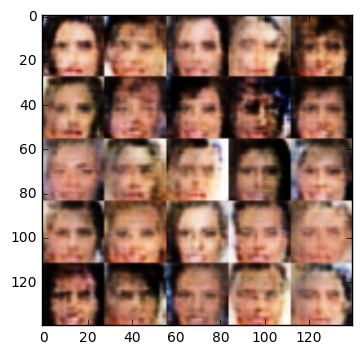

epoch 2 d_loss 1.3271050453186035 g_loss 0.826305627822876
epoch 2 d_loss 1.3670698404312134 g_loss 0.8235635161399841
epoch 2 d_loss 1.3797805309295654 g_loss 0.7807892560958862
epoch 2 d_loss 1.3931214809417725 g_loss 0.779172420501709
epoch 2 d_loss 1.3614859580993652 g_loss 0.8385205268859863
epoch 2 d_loss 1.3594424724578857 g_loss 0.8136309385299683
epoch 2 d_loss 1.3718476295471191 g_loss 0.7450838088989258
epoch 2 d_loss 1.3784282207489014 g_loss 0.7897692322731018
epoch 2 d_loss 1.3764173984527588 g_loss 0.8159106969833374
epoch 2 d_loss 1.3385947942733765 g_loss 0.8137340545654297


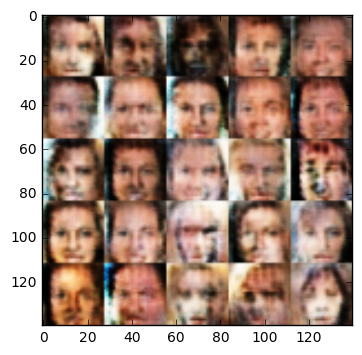

epoch 2 d_loss 1.386012315750122 g_loss 0.8085736036300659
epoch 2 d_loss 1.3684951066970825 g_loss 0.7702087163925171
epoch 2 d_loss 1.3533332347869873 g_loss 0.8392963409423828
epoch 2 d_loss 1.3649914264678955 g_loss 0.7680313587188721
epoch 2 d_loss 1.375206470489502 g_loss 0.7811732292175293
epoch 2 d_loss 1.3651807308197021 g_loss 0.8018547296524048
epoch 2 d_loss 1.3566452264785767 g_loss 0.8306020498275757
epoch 2 d_loss 1.3973926305770874 g_loss 0.8205456733703613
epoch 2 d_loss 1.3763599395751953 g_loss 0.8111661672592163
epoch 2 d_loss 1.3465969562530518 g_loss 0.7894498705863953


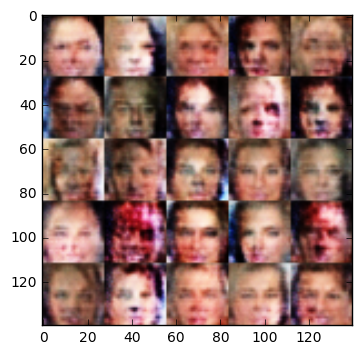

epoch 2 d_loss 1.3643770217895508 g_loss 0.8083166480064392
epoch 2 d_loss 1.3668670654296875 g_loss 0.8441654443740845
epoch 2 d_loss 1.3560147285461426 g_loss 0.8052338361740112
epoch 2 d_loss 1.3840351104736328 g_loss 0.8035088777542114
epoch 2 d_loss 1.355947732925415 g_loss 0.8152197599411011
epoch 2 d_loss 1.3775386810302734 g_loss 0.8056696653366089
epoch 2 d_loss 1.3746411800384521 g_loss 0.8056861162185669
epoch 2 d_loss 1.3625824451446533 g_loss 0.8159945011138916
epoch 2 d_loss 1.3573312759399414 g_loss 0.7653524875640869
epoch 2 d_loss 1.3755160570144653 g_loss 0.833629310131073


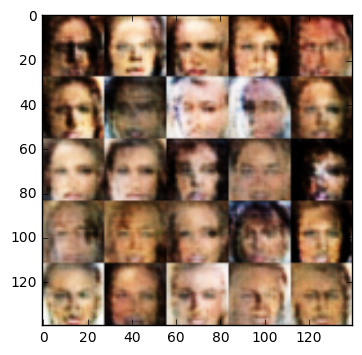

epoch 2 d_loss 1.375077724456787 g_loss 0.7715510725975037
epoch 2 d_loss 1.3699545860290527 g_loss 0.8321044445037842
epoch 2 d_loss 1.364156723022461 g_loss 0.7913997173309326
epoch 2 d_loss 1.3869564533233643 g_loss 0.9089180827140808
epoch 2 d_loss 1.3820106983184814 g_loss 0.8204715251922607
epoch 2 d_loss 1.3515141010284424 g_loss 0.8228286504745483
epoch 2 d_loss 1.3783743381500244 g_loss 0.8393823504447937
epoch 2 d_loss 1.3688181638717651 g_loss 0.789657473564148
epoch 2 d_loss 1.3712668418884277 g_loss 0.80842125415802
epoch 2 d_loss 1.384697675704956 g_loss 0.7639194130897522


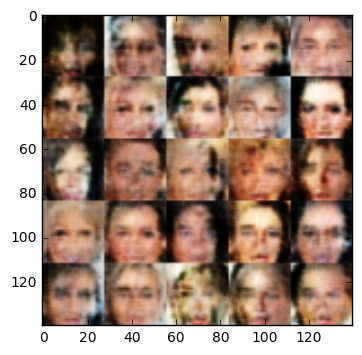

epoch 2 d_loss 1.3751227855682373 g_loss 0.8103628158569336
epoch 2 d_loss 1.35996675491333 g_loss 0.8309044241905212
epoch 2 d_loss 1.3813910484313965 g_loss 0.8242150545120239
epoch 2 d_loss 1.3603253364562988 g_loss 0.7842499017715454
epoch 2 d_loss 1.360236406326294 g_loss 0.8227629661560059
epoch 2 d_loss 1.355955958366394 g_loss 0.8066133260726929
epoch 2 d_loss 1.3554317951202393 g_loss 0.8062360286712646
epoch 2 d_loss 1.3693020343780518 g_loss 0.8063084483146667
epoch 2 d_loss 1.3869547843933105 g_loss 0.7977226376533508
epoch 2 d_loss 1.3820141553878784 g_loss 0.7730664610862732


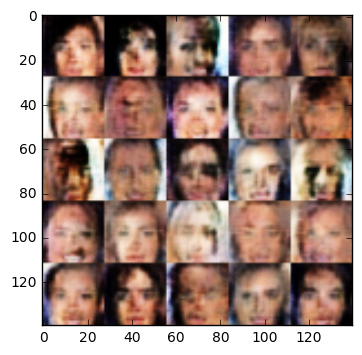

epoch 2 d_loss 1.3578770160675049 g_loss 0.8099024295806885
epoch 2 d_loss 1.3752117156982422 g_loss 0.8311817646026611
epoch 2 d_loss 1.4126121997833252 g_loss 0.7990604639053345
epoch 2 d_loss 1.3628159761428833 g_loss 0.8419215679168701
epoch 2 d_loss 1.3759541511535645 g_loss 0.7795386910438538
epoch 2 d_loss 1.3490873575210571 g_loss 0.8485850095748901
epoch 2 d_loss 1.367476224899292 g_loss 0.8279398083686829
epoch 2 d_loss 1.3706679344177246 g_loss 0.7633041143417358
epoch 2 d_loss 1.3583215475082397 g_loss 0.7739406824111938
epoch 2 d_loss 1.364535927772522 g_loss 0.8349736928939819


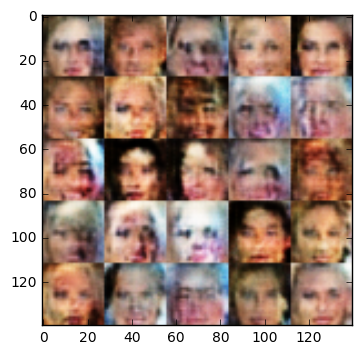

epoch 2 d_loss 1.3737311363220215 g_loss 0.8215452432632446
epoch 2 d_loss 1.3760268688201904 g_loss 0.7623922824859619
epoch 2 d_loss 1.3747353553771973 g_loss 0.8132238388061523
epoch 2 d_loss 1.3591516017913818 g_loss 0.8568008542060852
epoch 2 d_loss 1.3740472793579102 g_loss 0.8348686099052429
epoch 2 d_loss 1.3896268606185913 g_loss 0.7837879657745361
epoch 2 d_loss 1.3991261720657349 g_loss 0.7988314628601074
epoch 2 d_loss 1.3402318954467773 g_loss 0.8129855990409851
epoch 2 d_loss 1.367380976676941 g_loss 0.7924494743347168
epoch 2 d_loss 1.3810815811157227 g_loss 0.8440365791320801


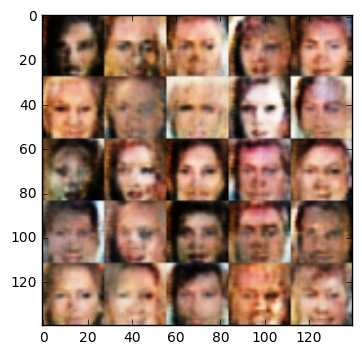

epoch 2 d_loss 1.3472416400909424 g_loss 0.77888023853302
epoch 2 d_loss 1.374497652053833 g_loss 0.7908845543861389
epoch 2 d_loss 1.3849022388458252 g_loss 0.8182317614555359
epoch 2 d_loss 1.362490177154541 g_loss 0.8266462683677673
epoch 2 d_loss 1.3628513813018799 g_loss 0.8043700456619263
epoch 2 d_loss 1.3907709121704102 g_loss 0.7895145416259766
epoch 2 d_loss 1.37142014503479 g_loss 0.7752322554588318
epoch 2 d_loss 1.3726089000701904 g_loss 0.8385738134384155
epoch 2 d_loss 1.3537979125976562 g_loss 0.8280312418937683
epoch 2 d_loss 1.3757712841033936 g_loss 0.7998473048210144


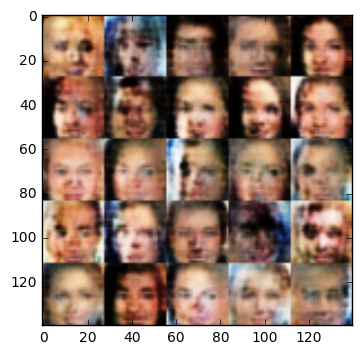

epoch 2 d_loss 1.3606863021850586 g_loss 0.7808517217636108
epoch 2 d_loss 1.3695549964904785 g_loss 0.7994990944862366
epoch 2 d_loss 1.3785713911056519 g_loss 0.8295239210128784
epoch 2 d_loss 1.370528221130371 g_loss 0.7861243486404419
epoch 2 d_loss 1.3828368186950684 g_loss 0.8358005881309509
epoch 2 d_loss 1.3509730100631714 g_loss 0.7887409329414368
epoch 2 d_loss 1.3683078289031982 g_loss 0.8202165961265564
epoch 2 d_loss 1.3771809339523315 g_loss 0.8083838820457458
epoch 2 d_loss 1.3639037609100342 g_loss 0.8059401512145996
epoch 2 d_loss 1.3819671869277954 g_loss 0.8356033563613892


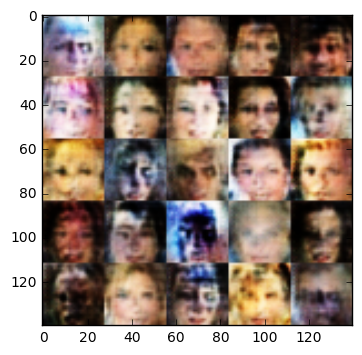

epoch 2 d_loss 1.3681443929672241 g_loss 0.783139705657959
epoch 2 d_loss 1.3768926858901978 g_loss 0.8052546977996826
epoch 2 d_loss 1.3576645851135254 g_loss 0.8133102655410767
epoch 2 d_loss 1.3795082569122314 g_loss 0.7992496490478516
epoch 2 d_loss 1.359714150428772 g_loss 0.8059475421905518
epoch 2 d_loss 1.3629268407821655 g_loss 0.8005189895629883
epoch 2 d_loss 1.4207508563995361 g_loss 0.7797379493713379
epoch 2 d_loss 1.364361047744751 g_loss 0.7917096018791199
epoch 2 d_loss 1.3686388731002808 g_loss 0.7783217430114746
epoch 2 d_loss 1.3528146743774414 g_loss 0.8246220350265503


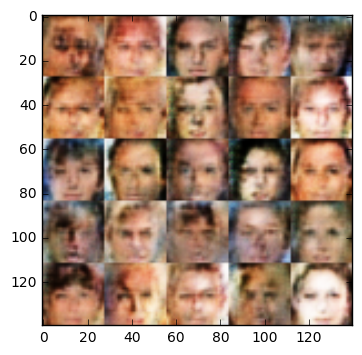

epoch 2 d_loss 1.3633010387420654 g_loss 0.7996459007263184
epoch 2 d_loss 1.382312297821045 g_loss 0.8276299238204956
epoch 2 d_loss 1.3780779838562012 g_loss 0.8049226999282837
epoch 2 d_loss 1.3676416873931885 g_loss 0.7904723882675171
epoch 2 d_loss 1.369525671005249 g_loss 0.7907940149307251
epoch 2 d_loss 1.3875077962875366 g_loss 0.7816435098648071
epoch 2 d_loss 1.373206615447998 g_loss 0.7798729538917542
epoch 2 d_loss 1.3852665424346924 g_loss 0.7887556552886963
epoch 2 d_loss 1.374420166015625 g_loss 0.7971752882003784
epoch 2 d_loss 1.3905236721038818 g_loss 0.7998615503311157


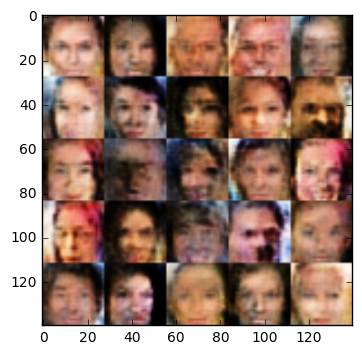

epoch 2 d_loss 1.3733494281768799 g_loss 0.8135195374488831
epoch 2 d_loss 1.356513261795044 g_loss 0.8032832741737366
epoch 2 d_loss 1.365987777709961 g_loss 0.7768786549568176
epoch 2 d_loss 1.3975118398666382 g_loss 0.8174642324447632
epoch 2 d_loss 1.397810935974121 g_loss 0.7862342000007629
epoch 2 d_loss 1.383711814880371 g_loss 0.7773839831352234
epoch 2 d_loss 1.3609944581985474 g_loss 0.7877562046051025
epoch 2 d_loss 1.3806877136230469 g_loss 0.8049346208572388
epoch 2 d_loss 1.3744107484817505 g_loss 0.7924821376800537
epoch 2 d_loss 1.3622257709503174 g_loss 0.7940647602081299


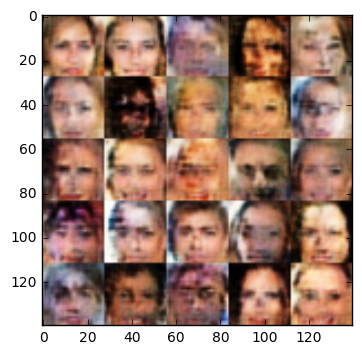

epoch 2 d_loss 1.379186749458313 g_loss 0.7938571572303772
epoch 2 d_loss 1.3610817193984985 g_loss 0.781110405921936
epoch 2 d_loss 1.3938138484954834 g_loss 0.7881611585617065
epoch 2 d_loss 1.3707811832427979 g_loss 0.7873493432998657
epoch 2 d_loss 1.3594657182693481 g_loss 0.8173577785491943
epoch 2 d_loss 1.3668901920318604 g_loss 0.8076545596122742
epoch 2 d_loss 1.3890327215194702 g_loss 0.854799747467041
epoch 2 d_loss 1.3755245208740234 g_loss 0.7891460657119751
epoch 2 d_loss 1.3906193971633911 g_loss 0.7817403078079224
epoch 2 d_loss 1.358094573020935 g_loss 0.8188166618347168


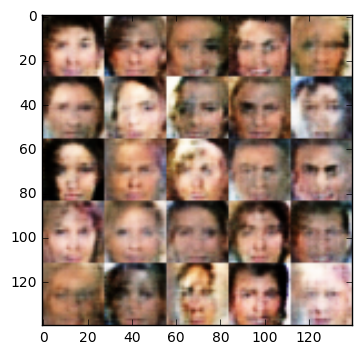

epoch 2 d_loss 1.3651578426361084 g_loss 0.82586669921875
epoch 2 d_loss 1.3739292621612549 g_loss 0.7859270572662354
epoch 2 d_loss 1.3605029582977295 g_loss 0.7936947345733643
epoch 2 d_loss 1.412697434425354 g_loss 0.8373720645904541
epoch 2 d_loss 1.3785829544067383 g_loss 0.8247967958450317
epoch 2 d_loss 1.377615213394165 g_loss 0.7688151597976685
epoch 2 d_loss 1.3683477640151978 g_loss 0.7878406047821045
epoch 2 d_loss 1.3784390687942505 g_loss 0.8004348278045654
epoch 2 d_loss 1.359226942062378 g_loss 0.8423005938529968
epoch 2 d_loss 1.3596317768096924 g_loss 0.8005927801132202


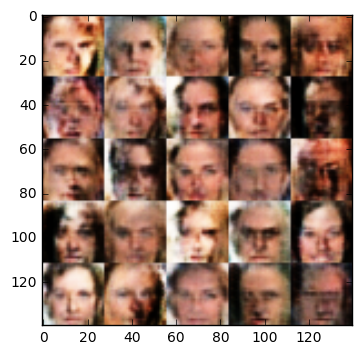

epoch 2 d_loss 1.3639073371887207 g_loss 0.8568457365036011
epoch 2 d_loss 1.3765394687652588 g_loss 0.7865015268325806
epoch 2 d_loss 1.400250792503357 g_loss 0.7357257604598999
epoch 2 d_loss 1.3646564483642578 g_loss 0.7758201956748962
epoch 2 d_loss 1.3670084476470947 g_loss 0.7995946407318115
epoch 2 d_loss 1.3828577995300293 g_loss 0.7933102250099182
epoch 2 d_loss 1.376185417175293 g_loss 0.7936265468597412
epoch 2 d_loss 1.392120599746704 g_loss 0.808116614818573
epoch 2 d_loss 1.3711762428283691 g_loss 0.7964504361152649
epoch 2 d_loss 1.3615717887878418 g_loss 0.7999430894851685


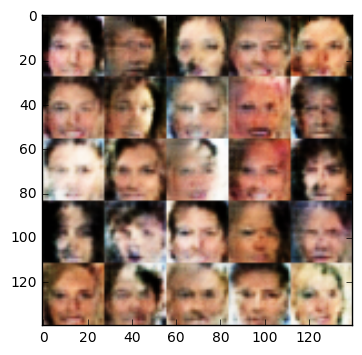

epoch 2 d_loss 1.373633623123169 g_loss 0.7751744389533997
epoch 2 d_loss 1.3438799381256104 g_loss 0.8071333169937134
epoch 2 d_loss 1.3860373497009277 g_loss 0.8283819556236267
epoch 2 d_loss 1.3695732355117798 g_loss 0.7934600114822388
epoch 2 d_loss 1.3834936618804932 g_loss 0.7767916917800903
epoch 2 d_loss 1.3659228086471558 g_loss 0.8162829875946045
epoch 2 d_loss 1.3765543699264526 g_loss 0.8299393057823181
epoch 2 d_loss 1.3704442977905273 g_loss 0.8236474394798279
epoch 2 d_loss 1.3816308975219727 g_loss 0.8025854825973511
epoch 2 d_loss 1.3675596714019775 g_loss 0.7944468259811401


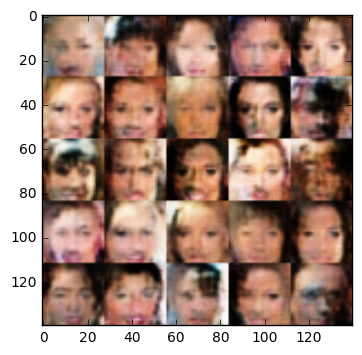

epoch 2 d_loss 1.3761255741119385 g_loss 0.770340621471405
epoch 2 d_loss 1.3764681816101074 g_loss 0.8359105587005615
epoch 2 d_loss 1.3721072673797607 g_loss 0.7931472063064575
epoch 2 d_loss 1.3657273054122925 g_loss 0.7978896498680115
epoch 2 d_loss 1.3704099655151367 g_loss 0.7945675253868103
epoch 2 d_loss 1.3773231506347656 g_loss 0.8257818222045898
epoch 2 d_loss 1.3803303241729736 g_loss 0.7942602634429932
epoch 2 d_loss 1.370413899421692 g_loss 0.7906047701835632
epoch 2 d_loss 1.3676835298538208 g_loss 0.7751914262771606
epoch 2 d_loss 1.3690202236175537 g_loss 0.8309627771377563


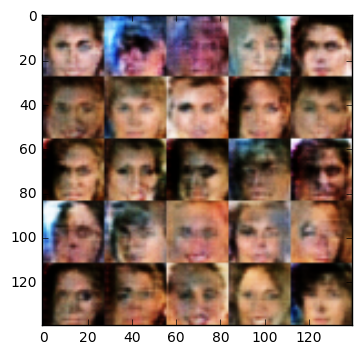

epoch 2 d_loss 1.3587796688079834 g_loss 0.7992521524429321
epoch 2 d_loss 1.3757929801940918 g_loss 0.8004425764083862
epoch 2 d_loss 1.3680520057678223 g_loss 0.8083574771881104
epoch 2 d_loss 1.3549413681030273 g_loss 0.7889589071273804
epoch 2 d_loss 1.3638598918914795 g_loss 0.7830992341041565
epoch 2 d_loss 1.3621771335601807 g_loss 0.8122897148132324
epoch 2 d_loss 1.3700637817382812 g_loss 0.8144453167915344
epoch 2 d_loss 1.386016607284546 g_loss 0.7674445509910583
epoch 2 d_loss 1.373070240020752 g_loss 0.8128470182418823
epoch 2 d_loss 1.367396593093872 g_loss 0.7794409990310669


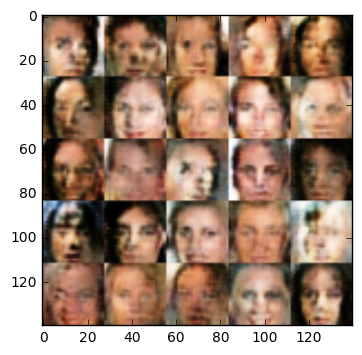

epoch 2 d_loss 1.3685314655303955 g_loss 0.8278340101242065
epoch 2 d_loss 1.380362629890442 g_loss 0.7788810133934021
epoch 2 d_loss 1.3541862964630127 g_loss 0.831154465675354
epoch 2 d_loss 1.382800579071045 g_loss 0.8015320897102356
epoch 2 d_loss 1.3720769882202148 g_loss 0.7984287738800049
epoch 2 d_loss 1.3711316585540771 g_loss 0.7977612018585205
epoch 2 d_loss 1.3613576889038086 g_loss 0.8028194904327393
epoch 2 d_loss 1.3962950706481934 g_loss 0.7875007390975952
epoch 2 d_loss 1.368061900138855 g_loss 0.8109048008918762
epoch 2 d_loss 1.3842021226882935 g_loss 0.8099181652069092


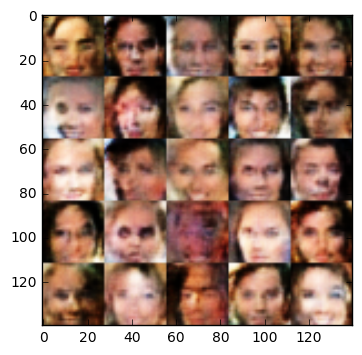

epoch 2 d_loss 1.3730474710464478 g_loss 0.7960681319236755
epoch 2 d_loss 1.3719680309295654 g_loss 0.7968294024467468
epoch 2 d_loss 1.3559319972991943 g_loss 0.8305693864822388
epoch 2 d_loss 1.3673346042633057 g_loss 0.8332086801528931
epoch 2 d_loss 1.3498021364212036 g_loss 0.8111833930015564
epoch 2 d_loss 1.3703398704528809 g_loss 0.7835540175437927
epoch 2 d_loss 1.3567051887512207 g_loss 0.8050452470779419
epoch 2 d_loss 1.350811243057251 g_loss 0.8124443888664246
epoch 2 d_loss 1.3917216062545776 g_loss 0.8262491226196289
epoch 2 d_loss 1.3765588998794556 g_loss 0.8234596252441406


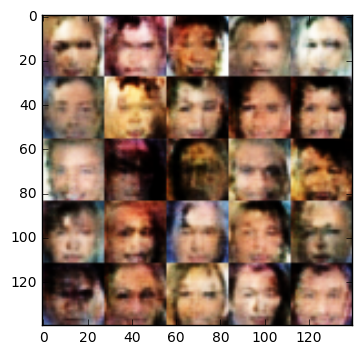

epoch 2 d_loss 1.3631237745285034 g_loss 0.8276710510253906
epoch 2 d_loss 1.3835759162902832 g_loss 0.7892602682113647
epoch 2 d_loss 1.3747880458831787 g_loss 0.7884119153022766
epoch 2 d_loss 1.3600232601165771 g_loss 0.8487917184829712
epoch 2 d_loss 1.3970885276794434 g_loss 0.7936125993728638
epoch 2 d_loss 1.368224024772644 g_loss 0.8005643486976624
epoch 2 d_loss 1.3781498670578003 g_loss 0.7732197642326355
epoch 2 d_loss 1.3786039352416992 g_loss 0.7893869280815125
epoch 2 d_loss 1.3560720682144165 g_loss 0.7943284511566162
epoch 2 d_loss 1.3686790466308594 g_loss 0.8058657050132751


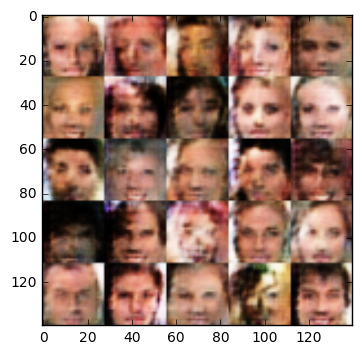

epoch 2 d_loss 1.378643274307251 g_loss 0.8308475613594055
epoch 2 d_loss 1.3694112300872803 g_loss 0.7894729375839233
epoch 2 d_loss 1.3763995170593262 g_loss 0.7973179221153259
epoch 2 d_loss 1.3704915046691895 g_loss 0.8328463435173035
epoch 2 d_loss 1.3660686016082764 g_loss 0.7906913757324219
epoch 2 d_loss 1.3718199729919434 g_loss 0.8063507676124573
epoch 2 d_loss 1.3799082040786743 g_loss 0.8040999174118042
epoch 2 d_loss 1.3719770908355713 g_loss 0.8250030279159546
epoch 2 d_loss 1.3802815675735474 g_loss 0.8106306791305542
epoch 2 d_loss 1.3653135299682617 g_loss 0.8203661441802979


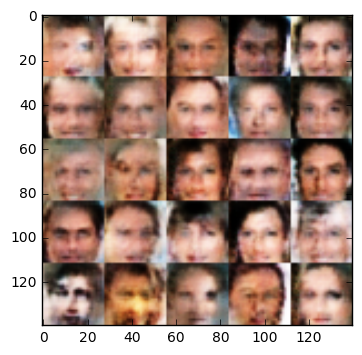

epoch 2 d_loss 1.37080717086792 g_loss 0.8144634366035461
epoch 2 d_loss 1.3817152976989746 g_loss 0.7860960960388184
epoch 2 d_loss 1.39471435546875 g_loss 0.841254711151123
epoch 2 d_loss 1.3898628950119019 g_loss 0.7910585403442383
epoch 2 d_loss 1.3657724857330322 g_loss 0.8295613527297974
epoch 2 d_loss 1.3644740581512451 g_loss 0.7528541088104248
epoch 2 d_loss 1.37470281124115 g_loss 0.7953691482543945
epoch 2 d_loss 1.35239839553833 g_loss 0.827595591545105
epoch 2 d_loss 1.375241756439209 g_loss 0.7629579305648804
epoch 2 d_loss 1.3562707901000977 g_loss 0.8240586519241333


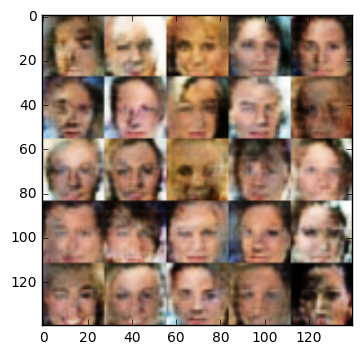

epoch 2 d_loss 1.385074496269226 g_loss 0.7584478855133057
epoch 2 d_loss 1.3685431480407715 g_loss 0.7888681888580322
epoch 2 d_loss 1.3666894435882568 g_loss 0.8323870897293091
epoch 2 d_loss 1.3772289752960205 g_loss 0.8041439652442932
epoch 2 d_loss 1.3573205471038818 g_loss 0.7960730195045471
epoch 2 d_loss 1.382325530052185 g_loss 0.7886225581169128
epoch 2 d_loss 1.3598129749298096 g_loss 0.814234733581543
epoch 2 d_loss 1.3792872428894043 g_loss 0.8198843002319336
epoch 2 d_loss 1.3585714101791382 g_loss 0.8165888786315918
epoch 2 d_loss 1.3623073101043701 g_loss 0.7948695421218872


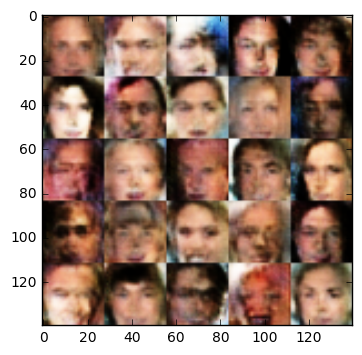

epoch 2 d_loss 1.3720790147781372 g_loss 0.7767679691314697
epoch 2 d_loss 1.3796875476837158 g_loss 0.8373416662216187
epoch 2 d_loss 1.3837412595748901 g_loss 0.7667990326881409
epoch 2 d_loss 1.3610625267028809 g_loss 0.8073834180831909
epoch 2 d_loss 1.3696777820587158 g_loss 0.8045319318771362
epoch 2 d_loss 1.3835190534591675 g_loss 0.7919297218322754
epoch 2 d_loss 1.364092469215393 g_loss 0.8231697082519531
epoch 2 d_loss 1.3747684955596924 g_loss 0.8025451898574829
epoch 2 d_loss 1.358599066734314 g_loss 0.804444432258606
epoch 2 d_loss 1.3702261447906494 g_loss 0.8323682546615601


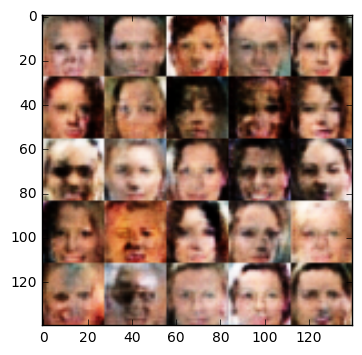

epoch 2 d_loss 1.3698400259017944 g_loss 0.7933098077774048
epoch 2 d_loss 1.3633694648742676 g_loss 0.7882665991783142
epoch 2 d_loss 1.3537492752075195 g_loss 0.8193092942237854


In [44]:
batch_size = 64
z_dim = 100
learning_rate = 0.0003
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.